# CSE603: Machine Learning - II

# Assignment 1

### Submitted by:
#### Name      : Muhammad Amin Ghias
#### ERP ID    : 25366

Date : 17th September 2022

# Analysis on Datasets for Regression

## Importing Libraries

In [1]:
import pandas as pd  
import matplotlib.pyplot as plt
import time

from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline


import warnings 
warnings.filterwarnings('ignore')


from sklearn.preprocessing import LabelEncoder
from mixed_naive_bayes import MixedNB
import numpy as np  
import matplotlib.pyplot as plt
import time

from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB, CategoricalNB, GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline
from matplotlib import pyplot

from numpy import mean


import warnings 
warnings.filterwarnings('ignore')

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.feature_selection import SequentialFeatureSelector
import os

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns


import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

from sklearn.preprocessing import PolynomialFeatures

from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from numpy import arange
from sklearn.linear_model import LassoCV
import warnings 
warnings.filterwarnings('ignore')

from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from sklearn.feature_selection import SequentialFeatureSelector

from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor


from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score




cv = KFold(n_splits=10, random_state=1, shuffle=True)
# reg = LinearRegression()


from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score


from numpy.random import normal
from numpy.random import exponential
import random
import re

from sklearn.ensemble import RandomForestRegressor

from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from numpy import arange
from sklearn.linear_model import LassoCV
import warnings 
warnings.filterwarnings('ignore')


from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn import tree
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline

import plotly.express as px
import plotly.graph_objects as go


# Making a Class for dataset Creation

In [2]:
class dataset:
    
    dataset_count=0
    
    def __init__(self,column_number,row_number,gausian_percent, exponential_percent, beta_dist_perecnt,binomial_precent,chisquare_perecent):
        
        self.data_dict ={}
        self.df=pd.DataFrame()
        
        self.gausian_list=[]
        self.gausian_dict={}
        
        self.exponential_dict={}
        self.exponential_list=[]
        
        self.binomial_dict={}
        self.binomial_list=[]
        
        self.beta_dist_dict={}
        self.beta_dist_list=[]
        
        self.chisquare_dict={}
        self.chisquare_list=[]
        
        self.label_rl_dict={}
        self.label_rl_list=[]
        
        
        self.row_number=row_number
        self.column_number= column_number
        
        
        self.precent_gausian = gausian_percent
        self.percent_beta_dist = beta_dist_perecnt
        self.percent_exponential = exponential_percent
        self.percent_binomial = binomial_precent
        self.percent_chisquare = chisquare_perecent
        
        
        self.col_gausian = int(column_number*(gausian_percent/100))
        self.col_beta_dist = int(column_number*(beta_dist_perecnt/100))
        self.col_exponential = int(column_number*(exponential_percent/100))
        self.col_binomial = int(column_number*(binomial_precent/100))
        self.col_chisquare = int(column_number*(chisquare_perecent/100))
        
        self.total= self.col_gausian + self.col_beta_dist + self.col_exponential +  self.col_binomial + self.col_chisquare 
        
        if self.total < self.column_number:
            self.col_gausian = self.col_gausian + (self.column_number-self.total)
            
        
        self.total= self.col_gausian + self.col_beta_dist + self.col_exponential +  self.col_binomial + self.col_chisquare 
        
    def print_desc(self):
        print("The data frame should have columns :", self.column_number)
        print("The data frame will have rows :", self.row_number)
        print("the ",self.precent_gausian, "% of gaussian distrubution  in our dataset will have gausian distributed columns :", self.col_gausian )
        print("the ",self.percent_beta_dist, "% of beta_dist distrubution  in our dataset will have beta_dist distributed columns :", self.col_beta_dist )
        print("the ",self.percent_exponential, "% of exponential distrubution  in our dataset will have exponential distributed columns :", self.col_exponential )
        print("the ",self.percent_binomial, "% of binomial distrubution  in our dataset will have binomial distributed columns :", self.col_binomial )
        print("the ",self.percent_chisquare, "% of chisquare distrubution  in our dataset will have chisquare distributed columns :", self.col_chisquare )
        print("The data frame will have total columns :", self.total)
     
        
    def make_gausian(self,mu,sigma):
        
        if type(mu) != list:
            mu=[mu]

        avg= sum(mu)/len(mu)
        avg= int(avg)
        if len(mu) < self.col_gausian:
            p=self.col_gausian-(len(mu))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))

            mu = mu + r
        
        if type(sigma) != list:
            sigma=[sigma]
        avg= sum(sigma)/len(sigma)
        avg= int(avg)
        if len(sigma) < self.col_gausian:
            p=self.col_gausian-(len(sigma))
            
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            sigma = sigma + r
        
        self.mu=mu
        self.sigma=sigma
        n=self.row_number
        
        self.avg_mu= sum(self.mu)/len(self.mu)
        self.avg_sigma= sum(self.sigma)/len(self.sigma)
  
        for i in range(self.col_gausian):
            sample =np.random.normal(self.mu[i], self.sigma[i], n)
            s = pd.Series(sample)
            self.gausian_list.append(s)
            self.data_dict['gaus'+str(i+1)]=s
            self.gausian_dict['gaus'+str(i+1)]=s
            
        self.df_gausian=pd.DataFrame(self.gausian_dict)
            

    def make_exponential(self,beta):
        
        if type(beta) != list:
            beta=[beta]
        avg= sum(beta)/len(beta)
        avg= int(avg)
        if len(beta) < self.col_exponential:
            p=self.col_exponential-(len(beta))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            beta = beta + r
            
        self.beta=beta
        n=self.row_number
        
        self.avg_beta= sum(self.beta)/len(self.beta)
                
        for i in range(self.col_exponential):
            sample =np.random.exponential(self.beta[i],  n)
            s = pd.Series(sample)
            self.exponential_list.append(s)
            self.data_dict['exp'+str(i+1)]=s
            self.exponential_dict['exp'+str(i+1)]=s
            
        self.df_exponential=pd.DataFrame(self.exponential_dict)
            
    
    
    def make_binomial(self,number_of_trials,prob_of_success_of_trial):
        
        if type(number_of_trials) != list:
            number_of_trials=[number_of_trials]
        avg= sum(number_of_trials)/len(number_of_trials)
        avg= int(avg)
        if len(number_of_trials) < self.col_binomial:
            p=self.col_binomial-(len(number_of_trials))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            number_of_trials = number_of_trials + r
        
        if type(prob_of_success_of_trial) != list:
            prob_of_success_of_trial=[prob_of_success_of_trial]
        avg= sum(prob_of_success_of_trial)/len(prob_of_success_of_trial)
        
        
        if len(prob_of_success_of_trial) < self.col_binomial:
            p=self.col_binomial-(len(prob_of_success_of_trial))
            r=list(np.random.randint(int(100*(avg-(0.2*avg))), int(100*(avg+(0.2*avg))), p))
            r = [x/100 for x in r]
        
            prob_of_success_of_trial = prob_of_success_of_trial + r
        
        self.number_of_trials=number_of_trials
        self.prob_of_success_of_trial=prob_of_success_of_trial
        n=self.row_number
        
        self.avg_number_of_trials= sum(self.number_of_trials)/len(self.number_of_trials)
        self.avg_prob_of_success_of_trial= sum(self.prob_of_success_of_trial)/len(self.prob_of_success_of_trial)

        for i in range(self.col_binomial):
            sample =np.random.binomial(self.number_of_trials[i], self.prob_of_success_of_trial[i], n)
            s = pd.Series(sample)
            self.binomial_list.append(s)
            self.data_dict['binom'+str(i+1)]=s
            self.binomial_dict['binom'+str(i+1)]=s
            
        self.df_binomial=pd.DataFrame(self.binomial_dict)
        
        
    
    def make_beta_dist(self,alpha,bet):
    
        if type(alpha) != list:
            alpha=[alpha]
        avg= sum(alpha)/len(alpha)
        avg= int(avg)
        if len(alpha) < self.col_beta_dist:
            p=self.col_beta_dist-(len(alpha))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            alpha = alpha + r
        
        
        if type(bet) != list:
            bet=[bet]
        avg= sum(bet)/len(bet)
        avg= int(avg)
        if len(bet) < self.col_beta_dist:
            p=self.col_beta_dist-(len(bet))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            bet = bet + r
            
        self.bet=bet
        self.alpha=alpha
        n=self.row_number
        
        self.avg_alpha= sum(self.alpha)/len(self.alpha)
                
        for i in range(self.col_beta_dist):
            sample =np.random.beta(self.alpha[i],self.bet[i],  n)
            s = pd.Series(sample)
            self.beta_dist_list.append(s)
            self.data_dict['beta'+str(i+1)]=s
            self.beta_dist_dict['beta'+str(i+1)]=s
            
        self.df_beta_dist=pd.DataFrame(self.beta_dist_dict)
    
    
    
    
    # degrees_of_freedom - mean, where the peak is. Default 0.
    # scale - standard deviation, the flatness of distribution. Default 1.
    # size - The shape of the returned array.
    
    def make_chisquare(self,degrees_of_freedom):
        
        if type(degrees_of_freedom) != list:
            degrees_of_freedom=[degrees_of_freedom]
        avg= sum(degrees_of_freedom)/len(degrees_of_freedom)
        avg= int(avg)
        if len(degrees_of_freedom) < self.col_chisquare:
            p=self.col_chisquare-(len(degrees_of_freedom))
            r=list(np.random.randint(int(avg-(0.2*avg)), int(avg+(0.2*avg)), p))
            degrees_of_freedom = degrees_of_freedom + r
        
        
        
        self.degrees_of_freedom=degrees_of_freedom
       
        n=self.row_number
        
        self.avg_degrees_of_freedom= sum(self.degrees_of_freedom)/len(self.degrees_of_freedom)
       
  
        for i in range(self.col_chisquare):
            sample =np.random.chisquare(self.degrees_of_freedom[i], n)
            s = pd.Series(sample)
            self.chisquare_list.append(s)
            self.data_dict['chi'+str(i+1)]=s
            self.chisquare_dict['chi'+str(i+1)]=s
            
        self.df_chisquare=pd.DataFrame(self.chisquare_dict)
    
    
    
    def make_label_rl(self):
    
        n=self.row_number
        sample =np.random.uniform(10000,100000,  n)
        s = pd.Series(sample)
        self.label_rl_list.append(s)
        self.data_dict['rl']=s
        self.label_rl_dict['rl']=s
            
        self.df_rl=pd.DataFrame(self.label_rl_dict)
        
    
    def make_dataframe(self):
        
        self.df=pd.DataFrame(self.data_dict)
        return(self.df)
    
    
    def change_dataframe_incr(self,percent):
        
        self.change_percent = 1 + (percent/100)
        n=self.row_number
        l = self.column_number -1
        p = int(self.column_number*0.3)
        r=random.sample(range(0, l), p)
        col = self.df.columns
        n=self.row_number
        
        self.df_ch_incr=self.df.copy()
        
        
        for i in r:
            
            c = col[i]
            
            if re.match('gaus', c):
                
                k=int(c[4])
              
                old_mu= self.mu[k-1]
                new_mu= int(self.mu[k-1]*self.change_percent)
                print('The old mu value is :',old_mu, 'new changed mu value is :',new_mu)
                
                old_sigma= self.sigma[k-1]
                new_sigma= int(self.sigma[k-1]*self.change_percent)
                print('The old sigma value is :',old_sigma, 'new changed sigma value is :',new_sigma)
                
                sample =np.random.normal(new_mu, new_sigma, n)
                s = pd.Series(sample)
                print(c)
                print(k)
                self.df_ch_incr[c]=s
                
            elif re.match('exp', c):
                
                k=int(c[3])
               
                old_beta= self.beta[k-1]
                new_beta= int(self.beta[k-1]*self.change_percent)
                print('The old beta value is :',old_beta, 'new changed beta value is :',new_beta)
                
                
                sample =np.random.exponential(new_beta, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
                
            elif re.match('beta', c):
                
                k=int(c[4])
               
                old_alpha= self.alpha[k-1]
                new_alpha= int(self.alpha[k-1]*self.change_percent)
                print('The old alpha value is :',old_alpha, 'new changed alpha value is :',new_alpha)
                
                old_bet= self.bet[k-1]
                new_bet= int(self.bet[k-1]*self.change_percent)
                print('The old bet value is :',old_bet, 'new changed bet value is :',new_bet)
                

                sample =np.random.beta(new_alpha, new_bet,  n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
                
            elif re.match('chi', c):
                
                k=int(c[3])
               
                old_degrees_of_freedom= self.degrees_of_freedom[k-1]
                new_degrees_of_freedom= int(self.degrees_of_freedom[k-1]*self.change_percent)
                print('The old degrees_of_freedom value is :',old_degrees_of_freedom, 'new changed degrees_of_freedom value is :',new_degrees_of_freedom)
                
                
                
                sample =np.random.chisquare(new_degrees_of_freedom, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
                
            elif re.match('bin', c):
                
                k=int(c[5])
            
                old_number_of_trials= self.number_of_trials[k-1]
                new_number_of_trials= int(self.number_of_trials[k-1]*self.change_percent)
                print('The old number_of_trials value is :',old_number_of_trials, 'new changed number_of_trials value is :',new_number_of_trials)
                
                old_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]
                new_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]*self.change_percent
                print('The old prob_of_success_of_trial value is :',old_prob_of_success_of_trial, 'new changed prob_of_success_of_trial value is :',new_prob_of_success_of_trial)
                
                sample =np.random.binomial(new_number_of_trials, new_prob_of_success_of_trial, n)
                
                s = pd.Series(sample)
                print(c)
                self.df_ch_incr[c]=s
        
        return(self.df_ch_incr)
                
                
    def change_dataframe_decr(self,percent):
        
        self.change_percent = 1 - (percent/100)
        n=self.row_number
        l = self.column_number -1
        p = int(self.column_number*0.3)
        r=random.sample(range(0, l), p)
        col = self.df.columns
        n=self.row_number
        
        self.df_ch_decr=self.df.copy()
        
        for i in r:
            
            c = col[i]
            
            if re.match('gaus', c):
                
                k=int(c[4])
              
                old_mu= self.mu[k-1]
                new_mu= int(self.mu[k-1]*self.change_percent)
                print('The old mu value is :',old_mu, 'new changed mu value is :',new_mu)
                
                old_sigma= self.sigma[k-1]
                new_sigma= int(self.sigma[k-1]*self.change_percent)
                print('The old sigma value is :',old_sigma, 'new changed sigma value is :',new_sigma)
                
                sample =np.random.normal(new_mu, new_sigma, n)
                s = pd.Series(sample)
                print(c)
                print(k)
                self.df_ch_decr[c]=s
                
            elif re.match('exp', c):
                
                k=int(c[3])
               
                old_beta= self.beta[k-1]
                new_beta= int(self.beta[k-1]*self.change_percent)
                print('The old beta value is :',old_beta, 'new changed beta value is :',new_beta)
                
                
                sample =np.random.exponential(new_beta, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
            elif re.match('beta', c):
                
                k=int(c[4])
               
                old_alpha= self.alpha[k-1]
                new_alpha= int(self.alpha[k-1]*self.change_percent)
                print('The old alpha value is :',old_alpha, 'new changed alpha value is :',new_alpha)
                
                old_bet= self.bet[k-1]
                new_bet= int(self.bet[k-1]*self.change_percent)
                print('The old bet value is :',old_bet, 'new changed bet value is :',new_bet)
    

                sample =np.random.beta(new_alpha,new_bet, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
            elif re.match('chi', c):
                
                k=int(c[3])
               
                old_degrees_of_freedom= self.degrees_of_freedom[k-1]
                new_degrees_of_freedom= int(self.degrees_of_freedom[k-1]*self.change_percent)
                print('The old degrees_of_freedom value is :',old_degrees_of_freedom, 'new changed degrees_of_freedom value is :',new_degrees_of_freedom)
                
                
                
                sample =np.random.chisquare(new_degrees_of_freedom, n)
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
            elif re.match('bin', c):
                
                k=int(c[5])
            
                old_number_of_trials= self.number_of_trials[k-1]
                new_number_of_trials= int(self.number_of_trials[k-1]*self.change_percent)
                print('The old number_of_trials value is :',old_number_of_trials, 'new changed number_of_trials value is :',new_number_of_trials)
                
                old_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]
                new_prob_of_success_of_trial= self.prob_of_success_of_trial[k-1]*self.change_percent
                print('The old prob_of_success_of_trial value is :',old_prob_of_success_of_trial, 'new changed prob_of_success_of_trial value is :',new_prob_of_success_of_trial)
                
                sample =np.random.binomial(new_number_of_trials, new_prob_of_success_of_trial, n)
                
                s = pd.Series(sample)
                print(c)
                self.df_ch_decr[c]=s
                
        return(self.df_ch_decr)  
    
    
    def print_parameters_desc(self):
       
        print('Distribution parameters')
        
        print('\nFor Gausian Distribution:')
        print('mu :', self.mu,'\nsigma :',self.sigma)   
        
        print('\nFor Exponential Distribution:')
        print('beat :', self.beta,) 
        
        print('\nFor Beta Distribution:')
        print('alpha :', self.alpha,'\nbet :',self.bet)  
        
        print('\nFor Binomial Distribution:')
        print('number_of_trials :', self.number_of_trials,'\nprob_of_success_of_trial :',self.prob_of_success_of_trial)
        
        print('\nFor Chi-Squared Distribution:')
        print('degrees_of_freedom :', self.degrees_of_freedom) 
        
        
        
       
    @classmethod   
    def count_dataset(cls):
        return (cls.dataset_count+1)
    
       
  

## Note:

#### The percentage of distibution required were : 65% should follow the gaussian distribution,10% exponential, 10% beta, 10% binomial, and 5% the chi-squared distribution

#### The dataset is prepared by randomly chosing the pd distribution parameters randomly

#### The label rl is made by using random uniform distribution form range 10000 to 100000. 

#### The pd distribution parameters are randomly chosen in a range of +20% to -20% from its average value given as input to ensure randomness


#### for % pd change random 30 % columns are chosen and their respective pd parameters as changed as per input required % change

# Making Required Dataset

In [3]:
dataset.count_dataset()

1

## Data_1

In [4]:

## dataset(column_number,row_number,gausian_percent, exponential_percent, beta_dist_perecnt,binomial_precent,chisquare_perecent)

data_1=dataset(20,75000,65,10,10,10,5)



In [5]:
dataset.count_dataset()

1

## Dataset Description

In [6]:
data_1.print_desc()

The data frame should have columns : 20
The data frame will have rows : 75000
the  65 % of gaussian distrubution  in our dataset will have gausian distributed columns : 13
the  10 % of beta_dist distrubution  in our dataset will have beta_dist distributed columns : 2
the  10 % of exponential distrubution  in our dataset will have exponential distributed columns : 2
the  10 % of binomial distrubution  in our dataset will have binomial distributed columns : 2
the  5 % of chisquare distrubution  in our dataset will have chisquare distributed columns : 1
The data frame will have total columns : 20


## Creating Dataset

In [7]:
data_1.make_gausian(500,12)

data_1.make_beta_dist(20,40)

data_1.make_exponential(50)

data_1.make_binomial(200,0.5)

data_1.make_chisquare(100)

data_1.make_label_rl()

data_1.make_dataframe()

df_1=data_1.df

print(df_1.shape)

df_1.head()

(75000, 21)


,gaus1,gaus2,gaus3,gaus4,gaus5,gaus6,gaus7,gaus8,gaus9,gaus10,...,gaus12,gaus13,beta1,beta2,exp1,exp2,binom1,binom2,chi1,rl
0,486.441291,424.575211,484.686274,505.894763,482.343690,529.466848,583.105148,512.648338,503.351101,443.592522,...,532.443067,532.797736,0.284583,0.305031,21.561590,5.161574,104,77,98.587993,88909.799691
1,498.478128,437.819963,463.071782,516.003961,485.039237,518.610233,569.971549,507.444912,508.400046,471.420835,...,538.037991,589.486384,0.387924,0.325486,64.738755,51.959475,96,90,125.149568,98604.062550
2,509.768296,418.605242,474.152308,501.650766,501.183843,524.781804,566.516909,505.491980,503.937696,453.598013,...,542.368417,533.489529,0.395650,0.336184,13.620580,77.475143,98,90,105.746449,73480.119353
3,504.421177,402.182169,451.405160,505.963678,489.151077,519.609547,570.832809,519.998739,522.437327,456.434310,...,560.433478,576.023018,0.372599,0.331915,5.781018,213.627871,109,85,101.001064,58582.111253
4,488.962936,413.997079,466.140153,515.305367,491.405073,521.379530,569.681412,507.821645,518.693827,456.159693,...,527.115881,580.076194,0.350190,0.354078,44.947184,3.477598,88,94,85.728865,70917.407494


## Dataset Distribution parameters description

In [8]:
data_1.print_parameters_desc()

Distribution parameters

For Gausian Distribution:
mu : [500, 422, 465, 513, 490, 522, 568, 512, 512, 453, 437, 541, 566] 
sigma : [12, 13, 12, 9, 9, 11, 11, 10, 9, 12, 11, 9, 13]

For Exponential Distribution:
beat : [50, 46]

For Beta Distribution:
alpha : [20, 20] 
bet : [40, 32]

For Binomial Distribution:
number_of_trials : [200, 181] 
prob_of_success_of_trial : [0.5, 0.49]

For Chi-Squared Distribution:
degrees_of_freedom : [100]


# Histogram of original Dataset

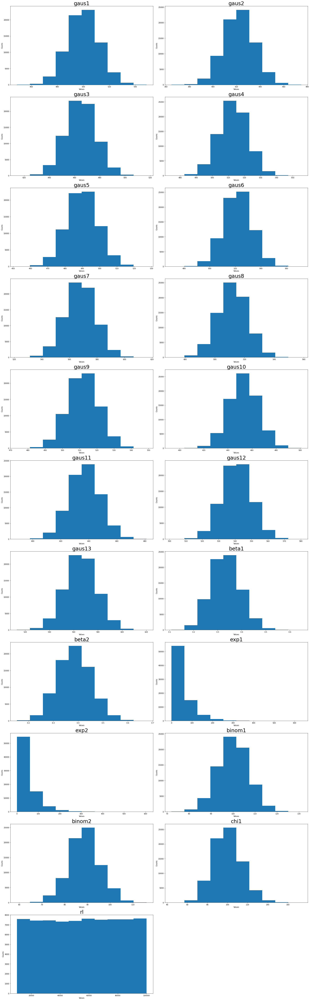

In [9]:
k=int(len(df_1.columns)/2)+1

plt.figure(figsize=(25, 80))

for i, col in enumerate(df_1.columns):

    plt.subplot(k, 2, i+1)
    plt.hist(df_1[col])
    plt.tight_layout()
    plt.title(col,size=30)
    plt.xlabel("Values")
    plt.ylabel("Counts")

# Distribution plot of original dataset

NumExpr defaulting to 8 threads.


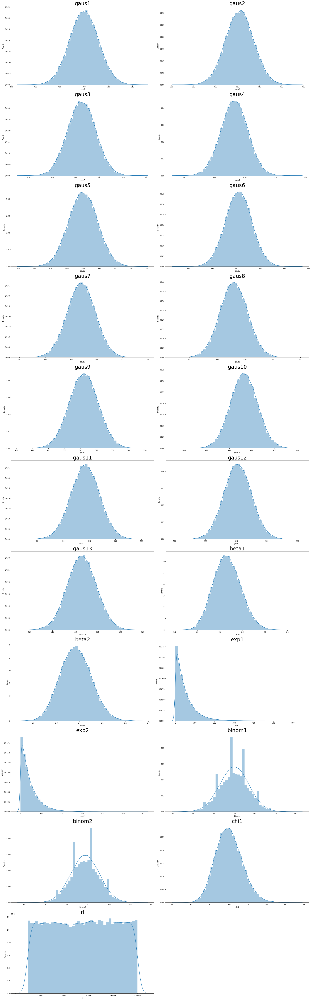

In [10]:
plt.figure(figsize=(25, 80))

for i, col in enumerate(df_1.columns):
        plt.subplot(k, 2, i+1)
        fig = sns.distplot(df_1[col])
        plt.tight_layout()
        plt.title(col,size=30)
        # plt.show()

# Complete ML- Model

In [13]:
score_df = pd.DataFrame(columns=['data_name','percent_change','model_details',
                                 'fit_time','predict_y_time',
                                 'rmse',
                                 'mse',
                                 'R2',
                                 'Ajusted_R2']
                                )

score_df.head()

,data_name,percent_change,model_details,fit_time,predict_y_time,rmse,mse,R2,Ajusted_R2


In [14]:

def data_models(dataset,data_name,percent_change):
    
    df_1=dataset
    k=int(len(df_1.columns)/2)+1
    
    
    plt.figure(figsize=(25, 80))

    for i, col in enumerate(df_1.columns):
        plt.subplot(k, 2, i+1)
        plt.hist(df_1[col])
        plt.tight_layout()
        plt.title(col,size=30)
        plt.xlabel("Values")
        plt.ylabel("Counts")
        
    plt.figure(figsize=(25, 80))

    for i, col in enumerate(df_1.columns):
        plt.subplot(k, 2, i+1)
        fig = sns.distplot(df_1[col])
        plt.tight_layout()
        plt.title(col,size=30)
        
    
        
        
    df_1.describe()

    df_1.info()

    for i in df_1.columns:
        # print(i)
        a=df_1[i].isnull().sum()
        print( i, ' Na values : ' ,a )
        
    cor=df_1.corr()

    cor

    # plotting correlation heatmap
    plt.figure(figsize=(18, 7))
    dataplot = sns.heatmap(cor, cmap="YlGnBu", annot=True)
    plt.show()
    
    
    
    df1_c=df_1.copy()
    print(df1_c.shape)



    X_df1_c=df1_c.drop(columns=['rl'])
    print(X_df1_c.shape)

    y_df1_c=df1_c['rl']
    print(y_df1_c.shape)


    trainX, testX, trainy, testy = train_test_split(X_df1_c, y_df1_c, test_size=0.3, random_state=2)
    
    
    clfRF = RandomForestRegressor(max_depth=5, max_features=4, min_samples_split=8,
                    n_estimators=100)#, random_state=0)
    clfRF.fit(trainX, trainy)
    importance_rf = pd.Series(clfRF.feature_importances_, index=trainX.columns)
        
    
    clfGB = GradientBoostingRegressor(max_depth=2,n_estimators=50)#, random_state=0)
    clfGB.fit(trainX, trainy)
    importance_GB = pd.Series(clfGB.feature_importances_, index=trainX.columns)

    importance_sorted = importance_GB + importance_rf

    importance_sorted = importance_rf.sort_values()


    plt.figure(figsize=(18, 7))
    importance_sorted.nlargest(20).plot(kind='barh', color='orange')

    plt.title("Feature Importance Random Forest+ Gradient Boosting")
    plt.show()

    z= int(0.5*len(df_1.columns))
    z

    b=importance_sorted.nlargest(z)

    col = list(b.index)

    col.append('rl')
    col

    dfr =df_1[col]

    print(dfr.columns)

    df1_c=dfr.copy()
    print(df1_c.shape)
   

    X_df1_c=df1_c.drop(columns=['rl'])
    print(X_df1_c.shape)

    y_df1_c=df1_c['rl']
    print(y_df1_c.shape)


    trainX, testX, trainy, testy = train_test_split(X_df1_c, y_df1_c, test_size=0.3, random_state=2)
   
    def fit_model(model, model_name, data_name, percent_change):
            
        start = time.perf_counter()
        model.fit(trainX,trainy)
        end = time.perf_counter()
        duration_fit = format((end-start),'.4f')
        print("Model:", model_name, "  Fitting Time Duration - {}".format(duration_fit))

        start = time.perf_counter()
        y_pred = model.predict(testX)
        end = time.perf_counter()
        duration_pred_y = format((end-start),'.4f')
        print("Model:", model_name, "  predicting-y Time Duration - {}".format(duration_pred_y))

        p= len(testX.columns)
        print(p)
        n= len(testX.index)
        print(n)
               
        rmse = mean_squared_error(testy, y_pred, squared=False)
        mse = mean_squared_error(testy, y_pred)
        r2= r2_score(testy, y_pred)
        Adj_r2 = 1-(1-r2)*((n-1)/(n-p-1))
     
        global score_df

        score_df =  score_df.append({'data_name': data_name ,'percent_change': percent_change ,'model_details' : model_name,
                                    'fit_time' : duration_fit,'predict_y_time': duration_pred_y,
                                    'rmse': rmse,
                                    'mse': mse,
                                    'R2': r2,
                                    'Ajusted_R2': Adj_r2}, ignore_index=True
                            )

        print(score_df)
 
        return(score_df)
        

    lr = LinearRegression()
    fit_model(lr, "Linear Regression",data_name, percent_change)
    
    ls = Lasso(alpha=10.5)
    fit_model(ls, "Lasso Regression",data_name, percent_change)
    
    rg = Ridge(alpha=1.5)
    fit_model(rg, "Ridge Regression",data_name, percent_change)
   

    dt = DecisionTreeRegressor(max_depth=5,random_state=0)  
    fit_model(dt, "Decision Tree",data_name, percent_change) 

    rf = RandomForestRegressor(max_depth=5,n_estimators=50)
    fit_model(rf, "Random Forest",data_name, percent_change)
    
    gb = GradientBoostingRegressor(max_depth=2,n_estimators=50)
    fit_model(gb, "Graident Boosting",data_name, percent_change)

    kn = KNeighborsRegressor(n_neighbors=5)
    fit_model(kn, "k-NN",data_name, percent_change)


    pipe_kn = Pipeline([("scaler", MinMaxScaler()), ("knr", KNeighborsRegressor(n_neighbors=5))])
    ss=fit_model(pipe_kn, "Scaled k-NN",data_name, percent_change)
 
    return(ss)
    
    

## Note:

#### Feature selection of random forrrest and gradient boosting combined is used and based on it top 50% features are chosen and rest removed

# Using model on Dataset

## Originial Dataset no change

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4   75000 non-null  float64
 4   gaus5   75000 non-null  float64
 5   gaus6   75000 non-null  float64
 6   gaus7   75000 non-null  float64
 7   gaus8   75000 non-null  float64
 8   gaus9   75000 non-null  float64
 9   gaus10  75000 non-null  float64
 10  gaus11  75000 non-null  float64
 11  gaus12  75000 non-null  float64
 12  gaus13  75000 non-null  float64
 13  beta1   75000 non-null  float64
 14  beta2   75000 non-null  float64
 15  exp1    75000 non-null  float64
 16  exp2    75000 non-null  float64
 17  binom1  75000 non-null  int32  
 18  binom2  75000 non-null  int32  
 19  chi1    75000 non-null  float64
 20  rl      75000 non-null  float64
dtypes: float64(19), int32(2)
memory usa

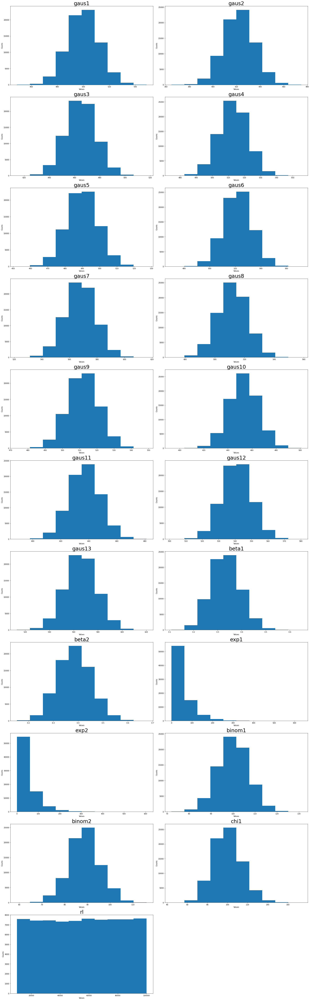

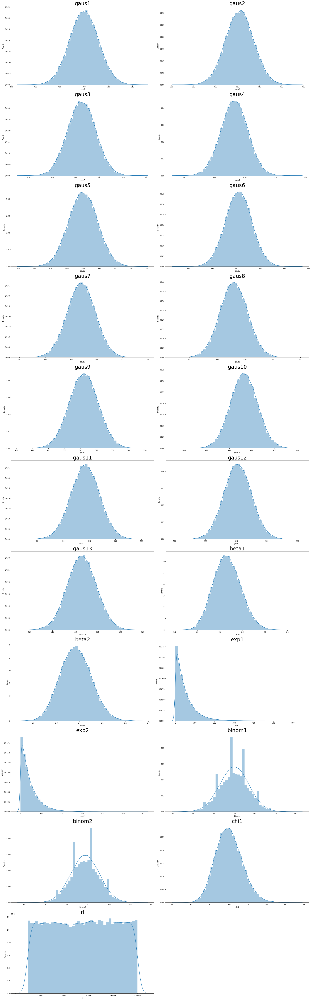

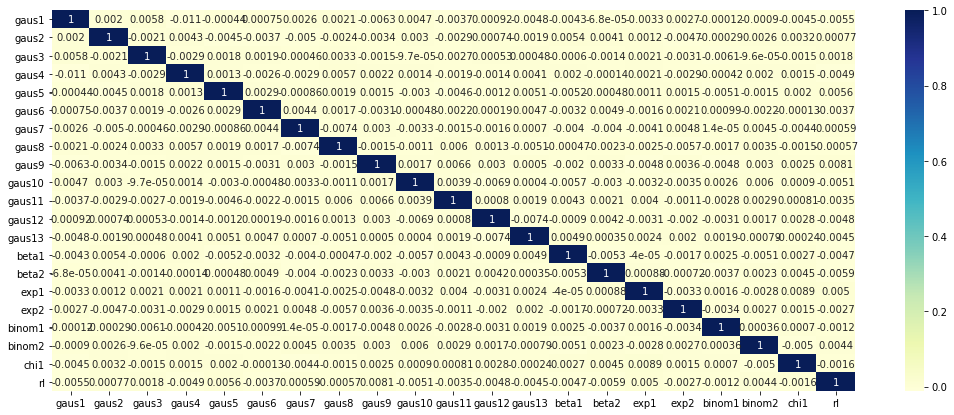

(75000, 21)
(75000, 20)
(75000,)


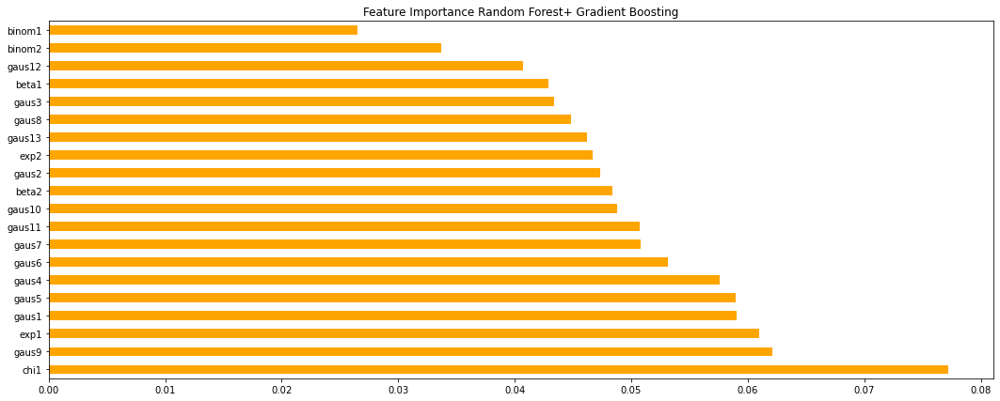

Index(['chi1', 'gaus9', 'exp1', 'gaus1', 'gaus5', 'gaus4', 'gaus6', 'gaus7',
       'gaus11', 'gaus10', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0105
Model: Linear Regression   predicting-y Time Duration - 0.0022
10
22500
  data_name percent_change      model_details fit_time predict_y_time  \
0    data_1             0%  Linear Regression   0.0105         0.0022   

           rmse           mse        R2  Ajusted_R2  
0  26044.288031  6.783049e+08  0.000244   -0.000201  
Model: Lasso Regression   Fitting Time Duration - 0.0096
Model: Lasso Regression   predicting-y Time Duration - 0.0019
10
22500
  data_name percent_change      model_details fit_time predict_y_time  \
0    data_1             0%  Linear Regression   0.0105         0.0022   
1    data_1             0%   Lasso Regression   0.0096         0.0019   

           rmse           mse        R2  Ajusted_R2  
0  26044.288031  6.783049e+08  0.000244   -0.00

In [15]:
results_0 = data_models(df_1,'data_1','0%')

## Note:

#### Due to randomness of generated dataset there is very small correlation bewteen features and target class

In [16]:
results_0

,data_name,percent_change,model_details,fit_time,predict_y_time,rmse,mse,R2,Ajusted_R2
0,data_1,0%,Linear Regression,0.0105,0.0022,26044.288031,6.783049e+08,0.000244,-0.000201
1,data_1,0%,Lasso Regression,0.0096,0.0019,26044.302210,6.783057e+08,0.000243,-0.000202
2,data_1,0%,Ridge Regression,0.0075,0.0023,26044.288031,6.783049e+08,0.000244,-0.000201
3,data_1,0%,Decision Tree,0.2884,0.0026,26080.368046,6.801856e+08,-0.002528,-0.002974
4,data_1,0%,Random Forest,9.0981,0.0325,26049.963218,6.786006e+08,-0.000192,-0.000637
5,data_1,0%,Graident Boosting,7.7168,0.0210,26047.201038,6.784567e+08,0.000020,-0.000425
6,data_1,0%,k-NN,0.1824,6.0935,28529.613523,8.139388e+08,-0.199668,-0.200201
7,data_1,0%,Scaled k-NN,0.1452,9.1049,28547.571700,8.149638e+08,-0.201178,-0.201713


## Result with decremental change in dataset parameters

The old beta value is : 50 new changed beta value is : 47
exp1
The old mu value is : 422 new changed mu value is : 400
The old sigma value is : 13 new changed sigma value is : 12
gaus2
2
The old mu value is : 500 new changed mu value is : 475
The old sigma value is : 12 new changed sigma value is : 11
gaus11
1
The old mu value is : 500 new changed mu value is : 475
The old sigma value is : 12 new changed sigma value is : 11
gaus13
1
The old mu value is : 568 new changed mu value is : 539
The old sigma value is : 11 new changed sigma value is : 10
gaus7
7
The old alpha value is : 20 new changed alpha value is : 19
The old bet value is : 40 new changed bet value is : 38
beta1
5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   gaus1   75000 non-null  float64
 1   gaus2   75000 non-null  float64
 2   gaus3   75000 non-null  float64
 3   gaus4   75000 no

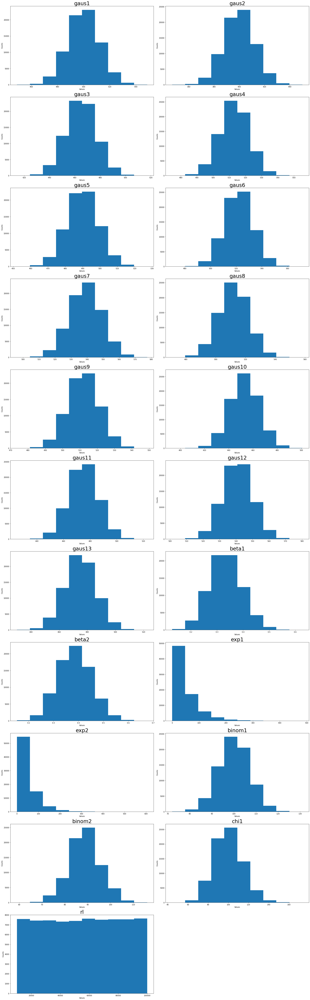

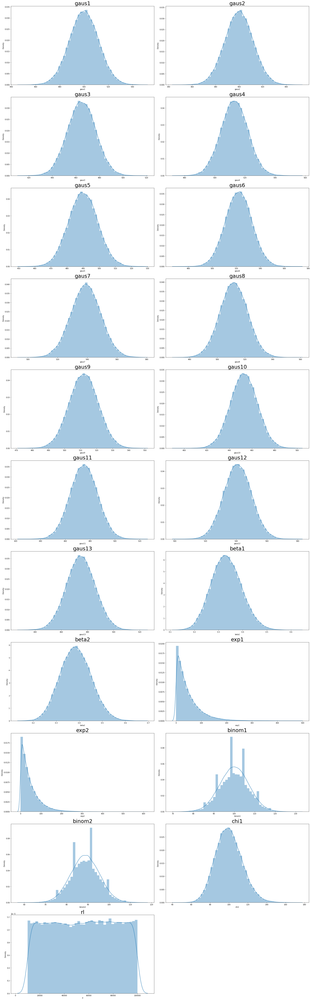

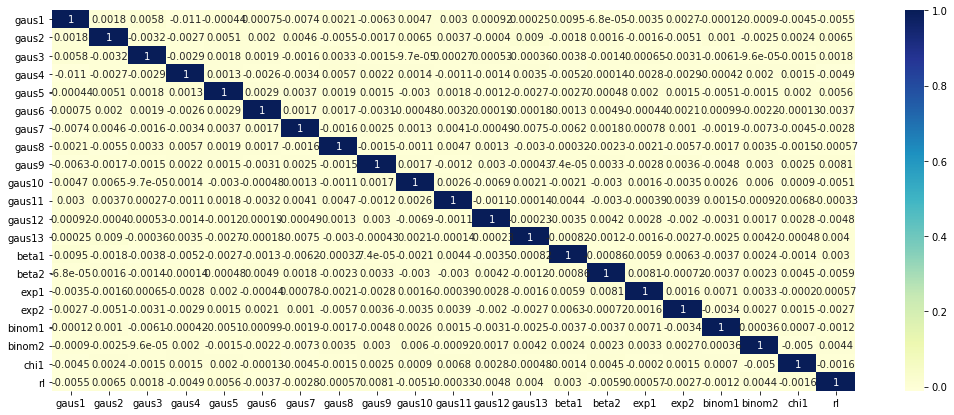

(75000, 21)
(75000, 20)
(75000,)


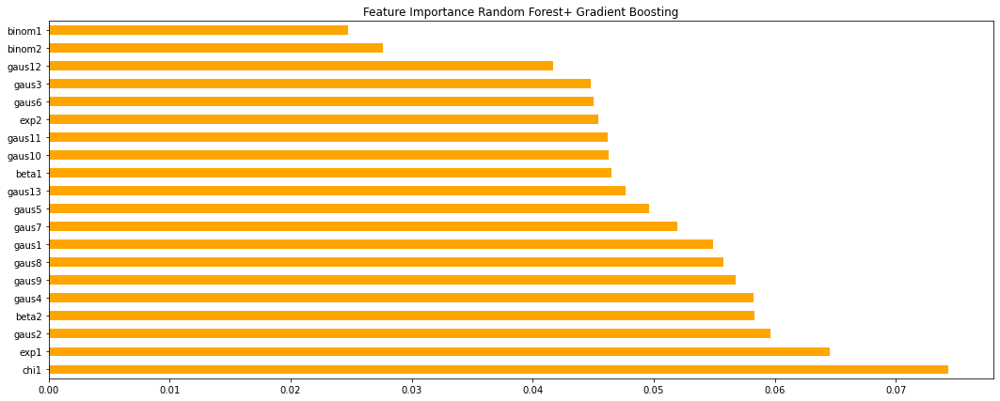

Index(['chi1', 'exp1', 'gaus2', 'beta2', 'gaus4', 'gaus9', 'gaus8', 'gaus1',
       'gaus7', 'gaus5', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0078
Model: Linear Regression   predicting-y Time Duration - 0.0023
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
5     data_1             0%  Graident Boosting   7.7168         0.0210   
6     data_1             0%               k-NN   0.1824         6.0935   
7     data_1             0%        Scaled k-NN   0.1452         9.1049   
8     data_1        5% incr  Linear Regr

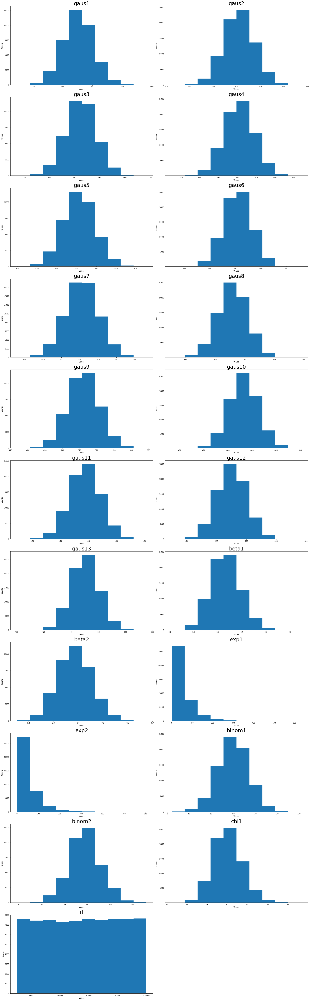

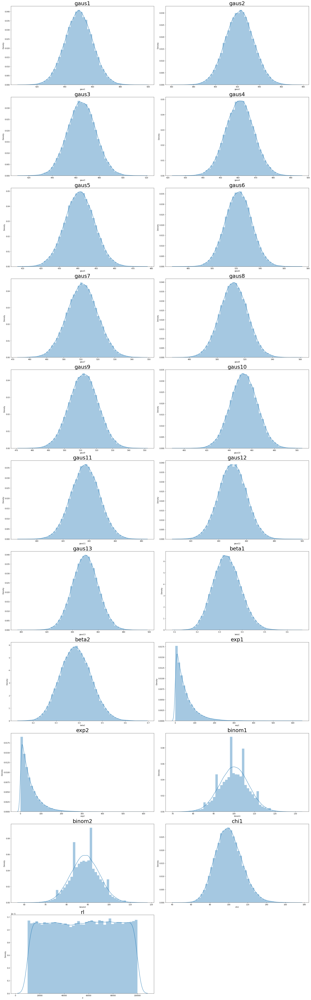

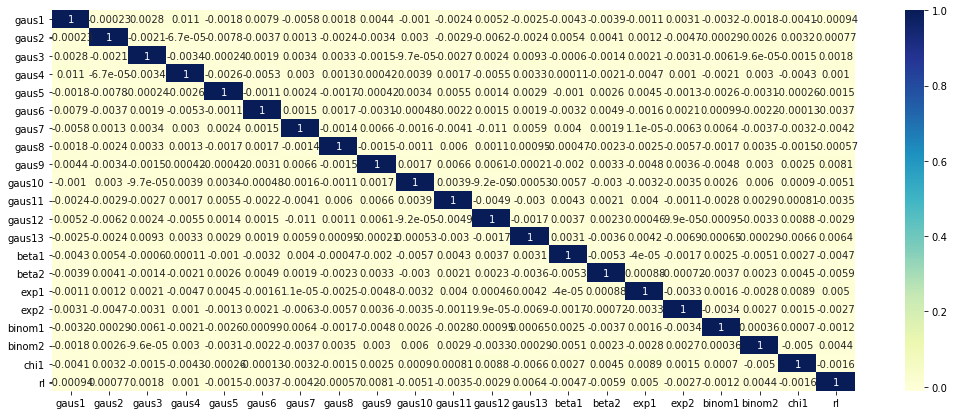

(75000, 21)
(75000, 20)
(75000,)


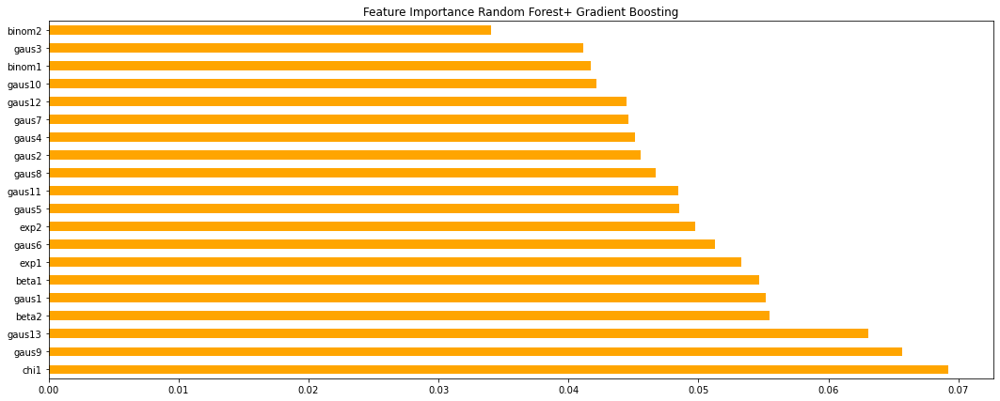

Index(['chi1', 'gaus9', 'gaus13', 'beta2', 'gaus1', 'beta1', 'exp1', 'gaus6',
       'exp2', 'gaus5', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0088
Model: Linear Regression   predicting-y Time Duration - 0.0020
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
5     data_1             0%  Graident Boosting   7.7168         0.0210   
6     data_1             0%               k-NN   0.1824         6.0935   
7     data_1             0%        Scaled k-NN   0.1452         9.1049   
8     data_1        5% incr  Linear Regr

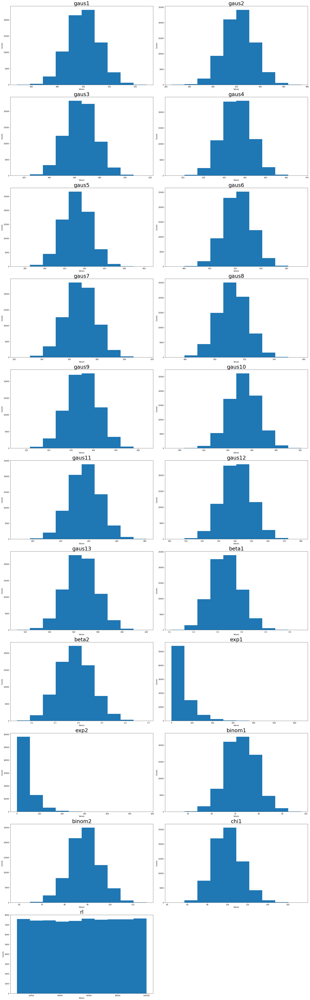

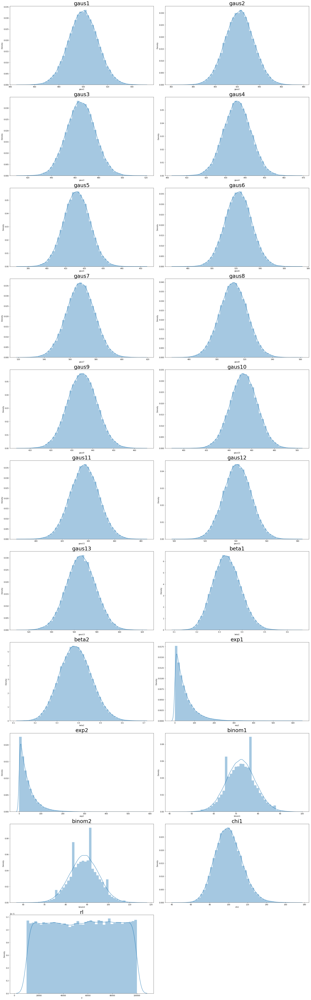

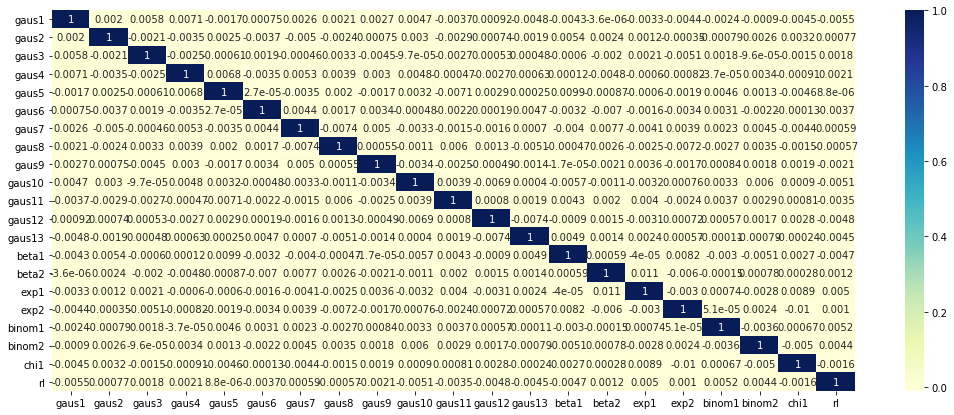

(75000, 21)
(75000, 20)
(75000,)


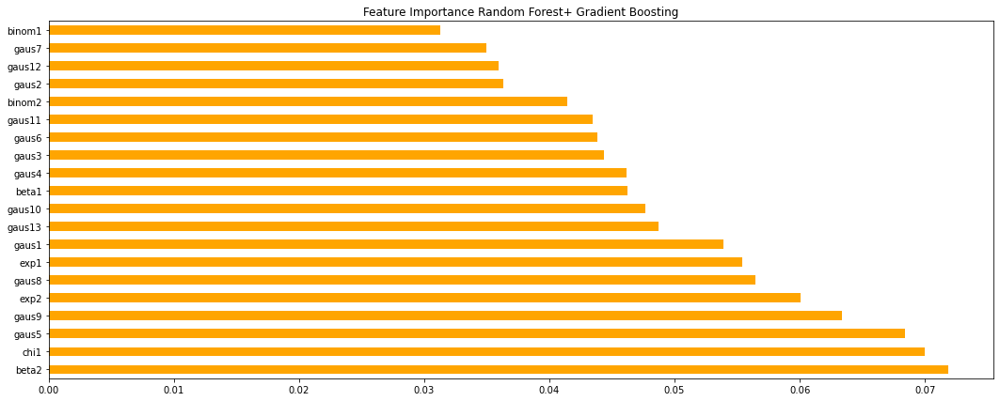

Index(['beta2', 'chi1', 'gaus5', 'gaus9', 'exp2', 'gaus8', 'exp1', 'gaus1',
       'gaus13', 'gaus10', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0135
Model: Linear Regression   predicting-y Time Duration - 0.0033
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
5     data_1             0%  Graident Boosting   7.7168         0.0210   
6     data_1             0%               k-NN   0.1824         6.0935   
7     data_1             0%        Scaled k-NN   0.1452         9.1049   
8     data_1        5% incr  Linear Reg

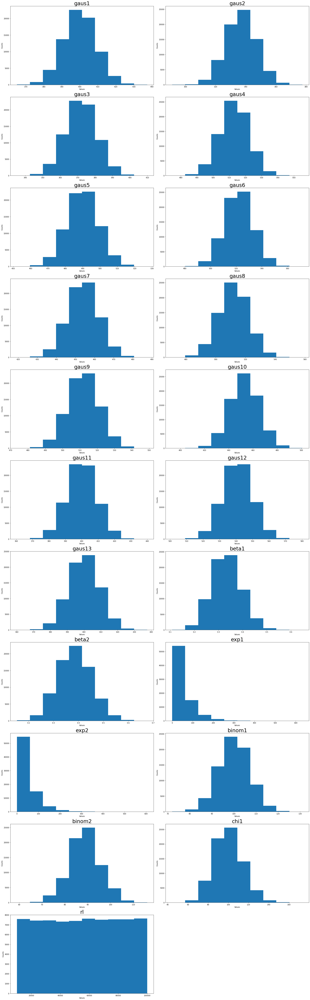

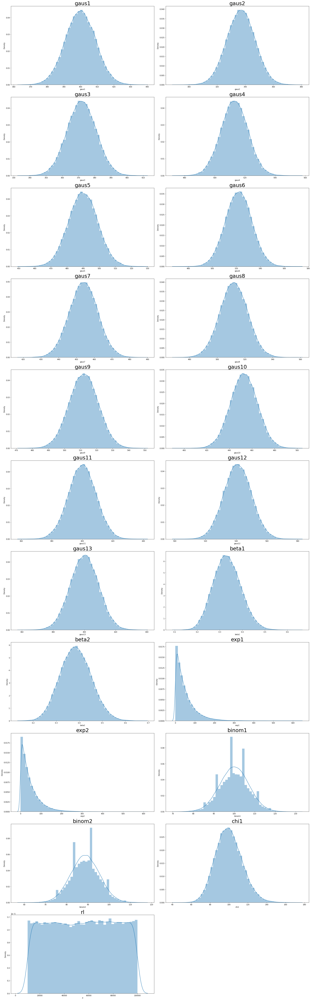

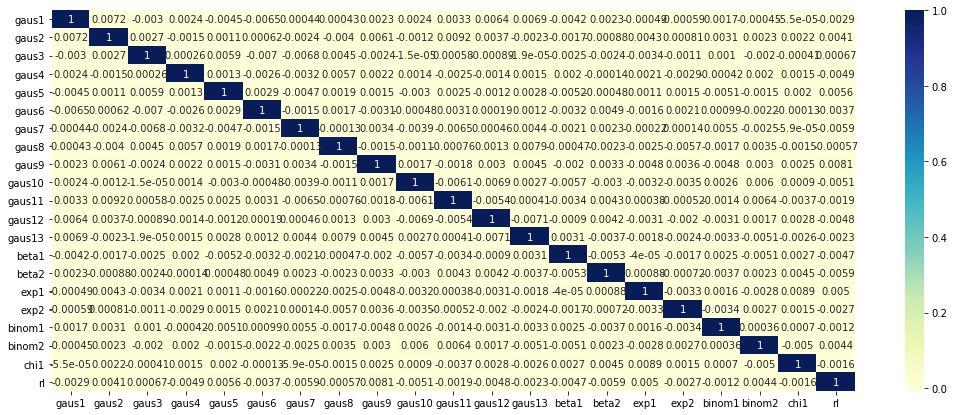

(75000, 21)
(75000, 20)
(75000,)


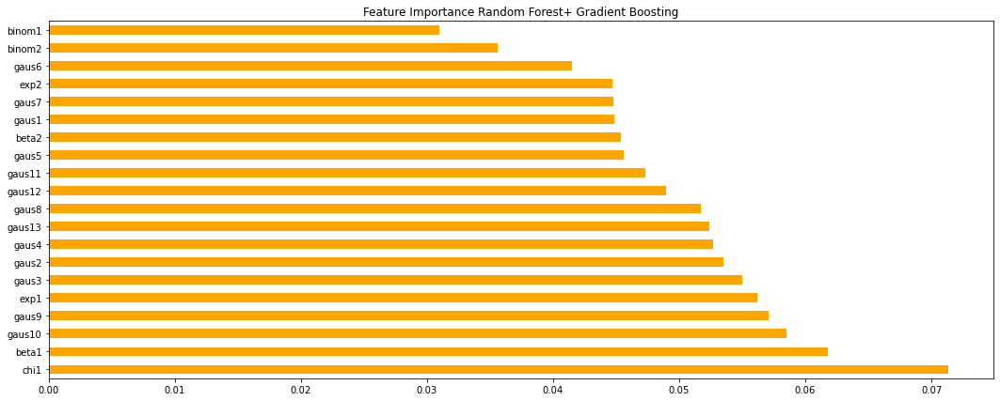

Index(['chi1', 'beta1', 'gaus10', 'gaus9', 'exp1', 'gaus3', 'gaus2', 'gaus4',
       'gaus13', 'gaus8', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0090
Model: Linear Regression   predicting-y Time Duration - 0.0023
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
5     data_1             0%  Graident Boosting   7.7168         0.0210   
6     data_1             0%               k-NN   0.1824         6.0935   
7     data_1             0%        Scaled k-NN   0.1452         9.1049   
8     data_1        5% incr  Linear Re

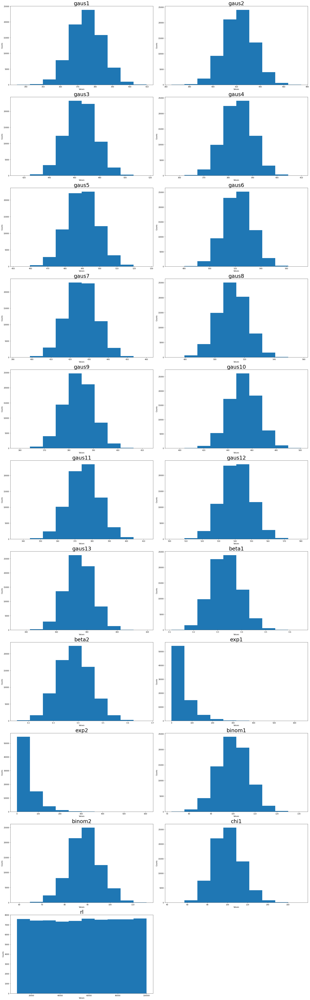

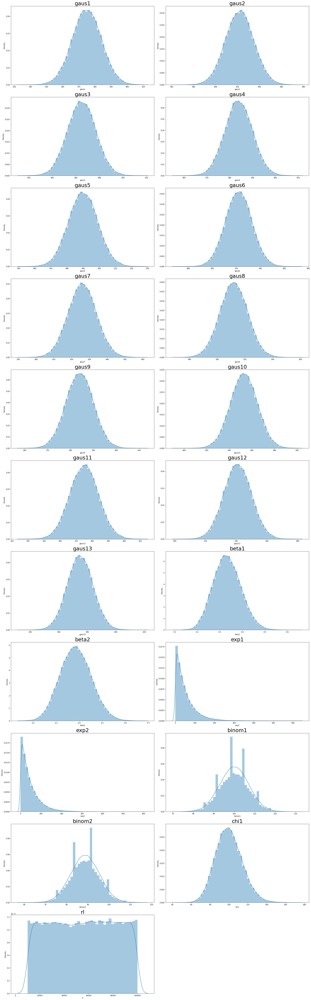

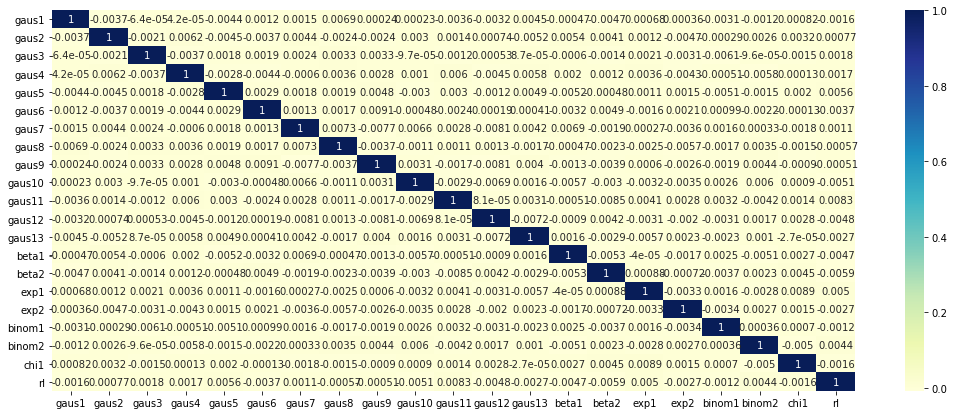

(75000, 21)
(75000, 20)
(75000,)


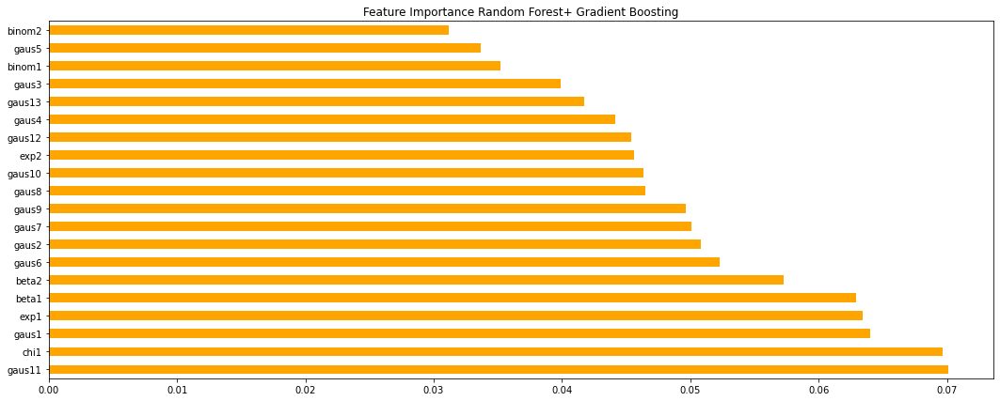

Index(['gaus11', 'chi1', 'gaus1', 'exp1', 'beta1', 'beta2', 'gaus6', 'gaus2',
       'gaus7', 'gaus9', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0114
Model: Linear Regression   predicting-y Time Duration - 0.0021
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
5     data_1             0%  Graident Boosting   7.7168         0.0210   
6     data_1             0%               k-NN   0.1824         6.0935   
7     data_1             0%        Scaled k-NN   0.1452         9.1049   
8     data_1        5% incr  Linear Reg

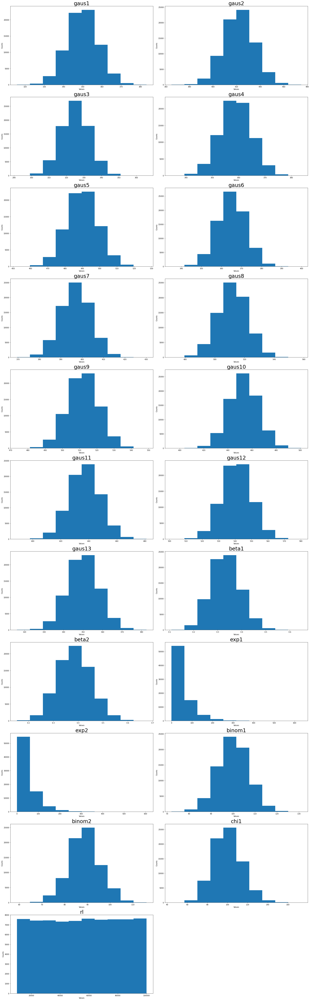

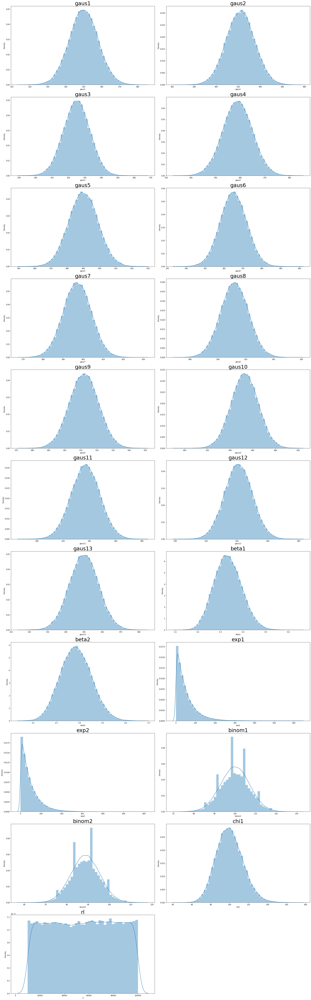

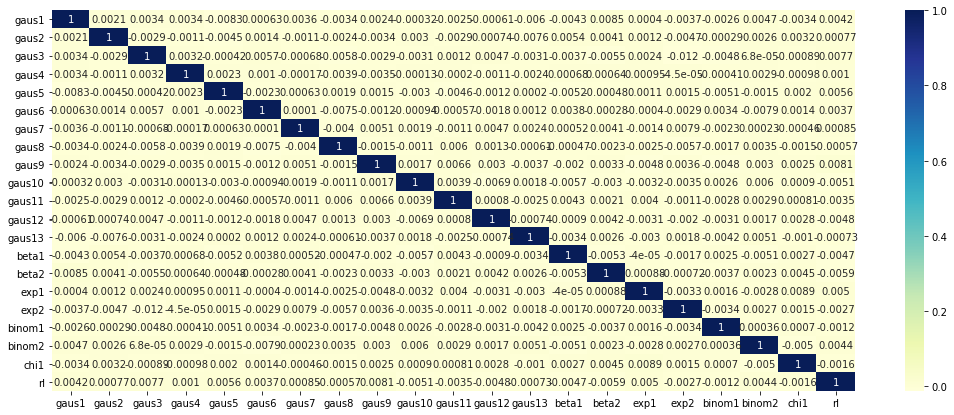

(75000, 21)
(75000, 20)
(75000,)


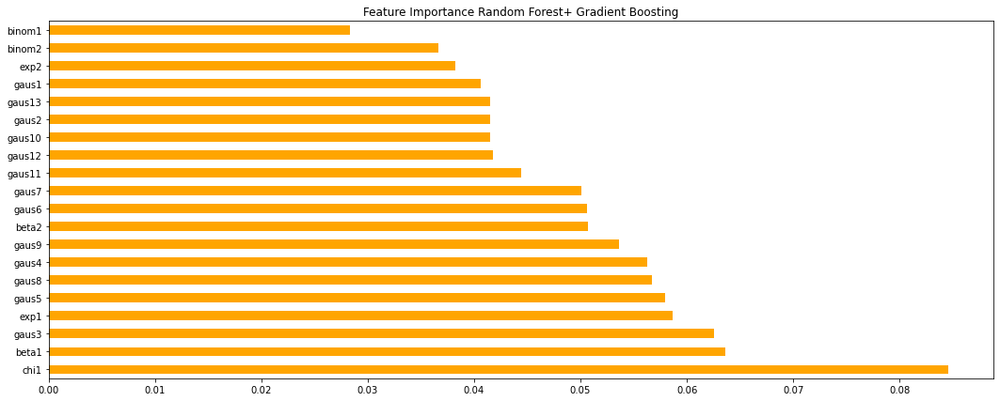

Index(['chi1', 'beta1', 'gaus3', 'exp1', 'gaus5', 'gaus8', 'gaus4', 'gaus9',
       'beta2', 'gaus6', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0095
Model: Linear Regression   predicting-y Time Duration - 0.0021
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
5     data_1             0%  Graident Boosting   7.7168         0.0210   
6     data_1             0%               k-NN   0.1824         6.0935   
7     data_1             0%        Scaled k-NN   0.1452         9.1049   
8     data_1        5% incr  Linear Regr

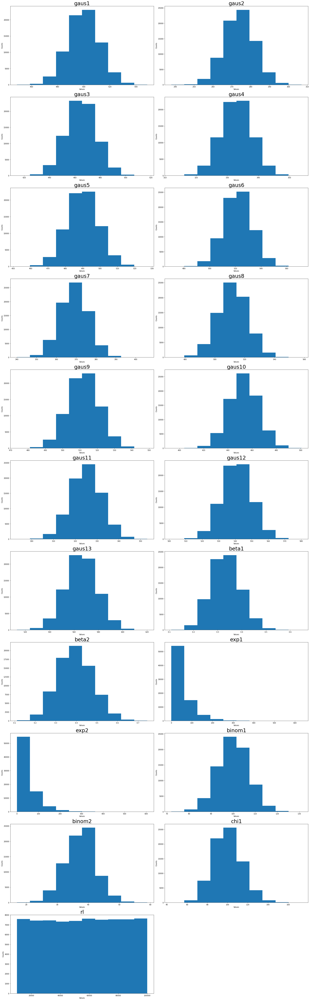

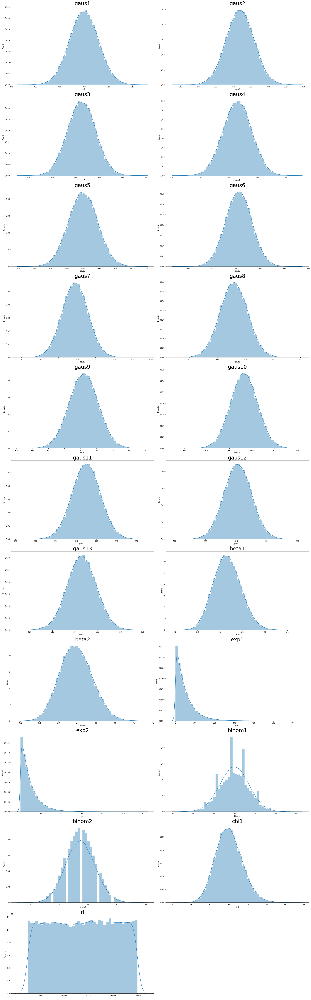

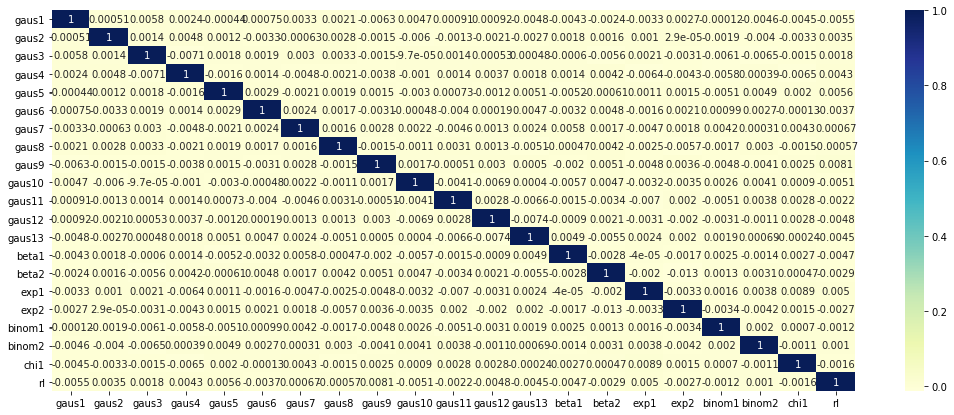

(75000, 21)
(75000, 20)
(75000,)


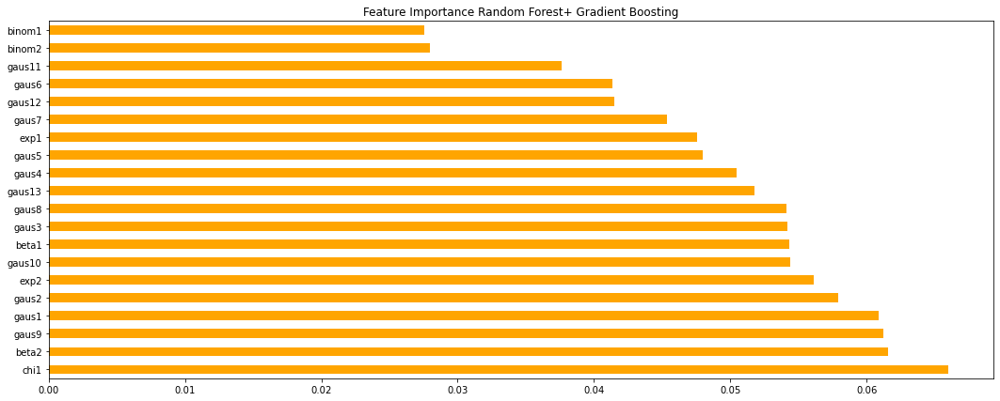

Index(['chi1', 'beta2', 'gaus9', 'gaus1', 'gaus2', 'exp2', 'gaus10', 'beta1',
       'gaus3', 'gaus8', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0085
Model: Linear Regression   predicting-y Time Duration - 0.0021
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
..       ...            ...                ...      ...            ...   
60    data_1       30% decr      Random Forest   9.6089         0.0368   
61    data_1       30% decr  Graident Boosting   6.6105         0.0104   
62    data_1       30% decr            

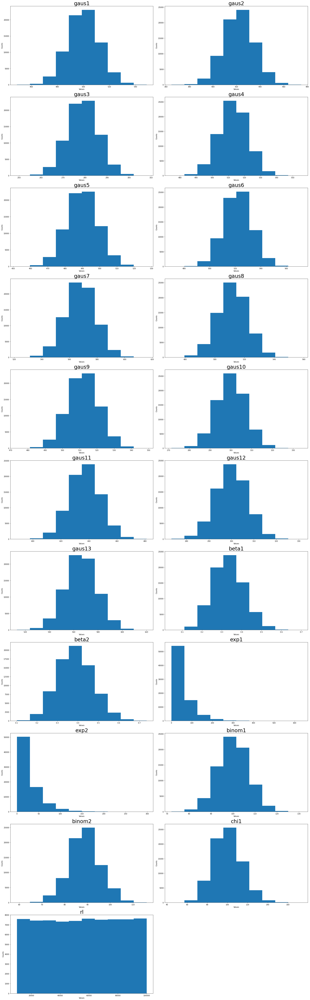

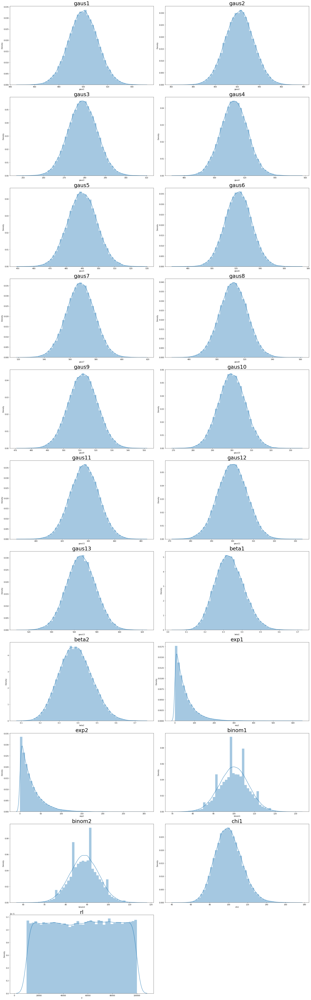

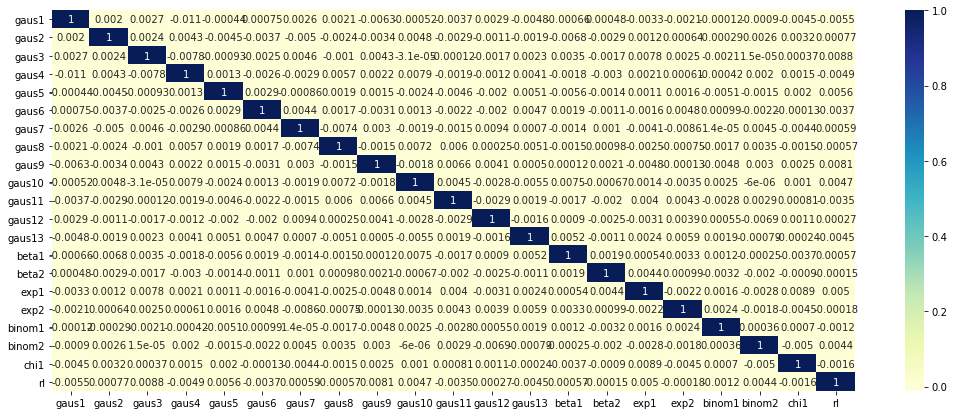

(75000, 21)
(75000, 20)
(75000,)


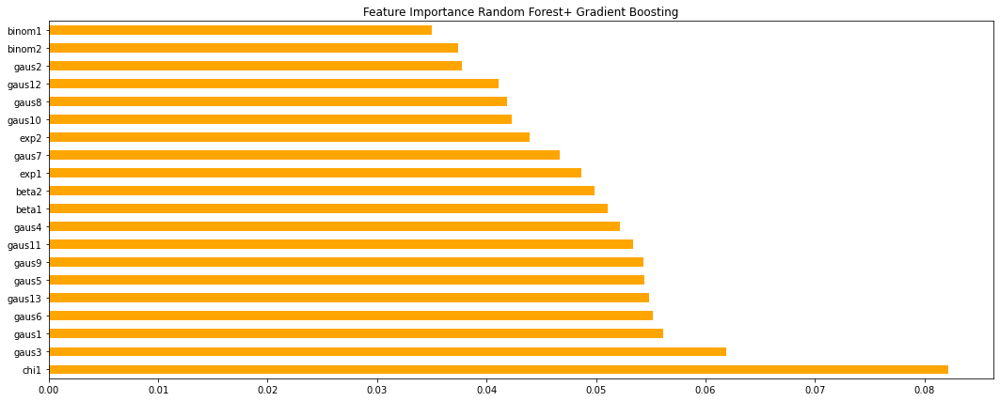

Index(['chi1', 'gaus3', 'gaus1', 'gaus6', 'gaus13', 'gaus5', 'gaus9', 'gaus11',
       'gaus4', 'beta1', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0093
Model: Linear Regression   predicting-y Time Duration - 0.0020
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
..       ...            ...                ...      ...            ...   
68    data_1       35% decr      Random Forest   8.6998         0.0280   
69    data_1       35% decr  Graident Boosting   6.1514         0.0087   
70    data_1       35% decr          

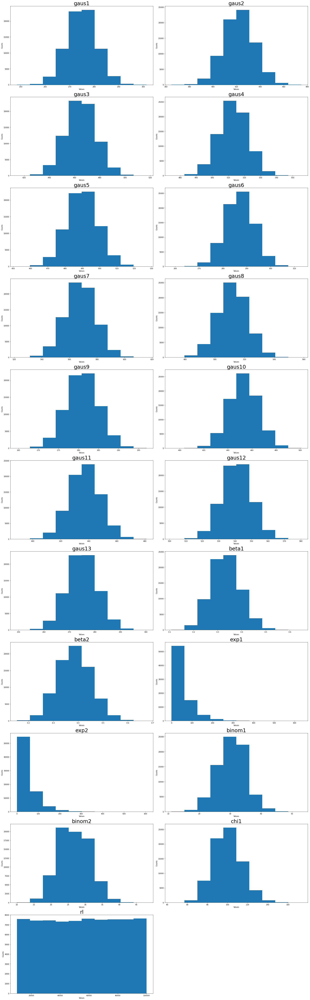

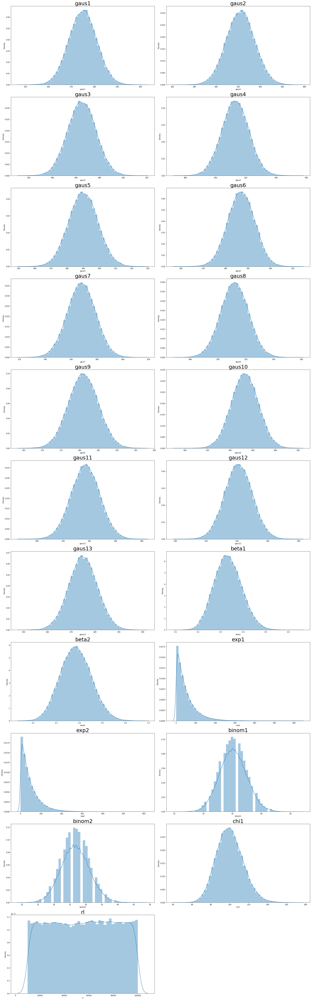

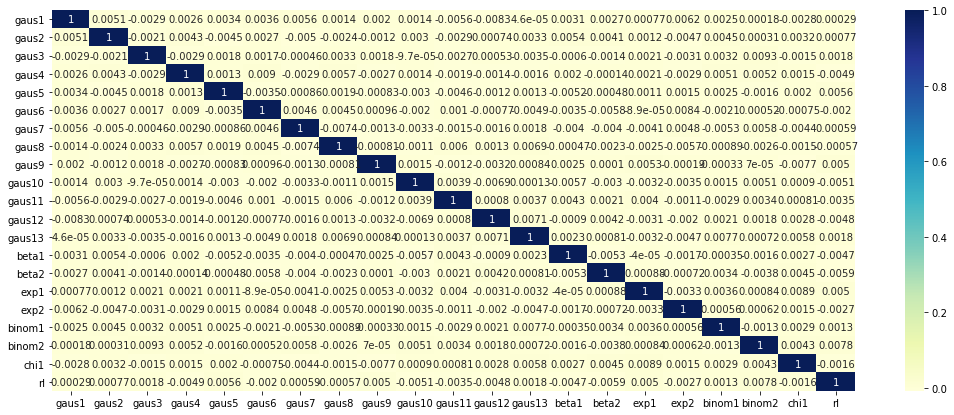

(75000, 21)
(75000, 20)
(75000,)


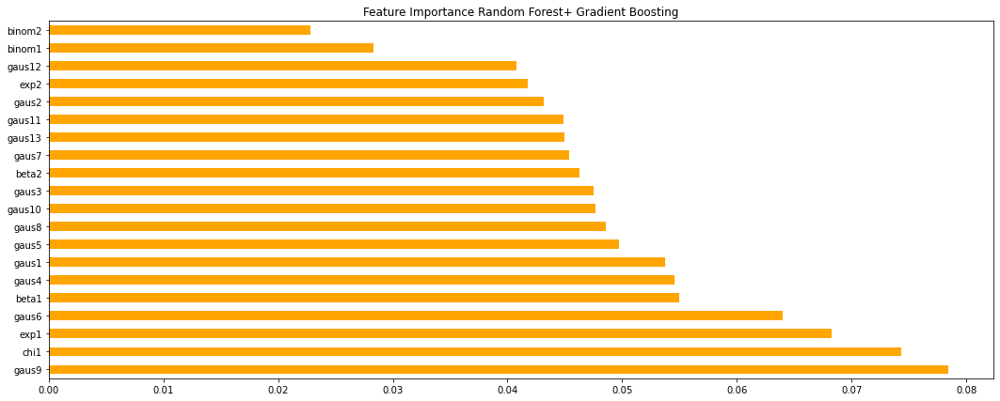

Index(['gaus9', 'chi1', 'exp1', 'gaus6', 'beta1', 'gaus4', 'gaus1', 'gaus5',
       'gaus8', 'gaus10', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0082
Model: Linear Regression   predicting-y Time Duration - 0.0027
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
..       ...            ...                ...      ...            ...   
76    data_1       40% decr      Random Forest   8.8457         0.0294   
77    data_1       40% decr  Graident Boosting   6.0245         0.0097   
78    data_1       40% decr            

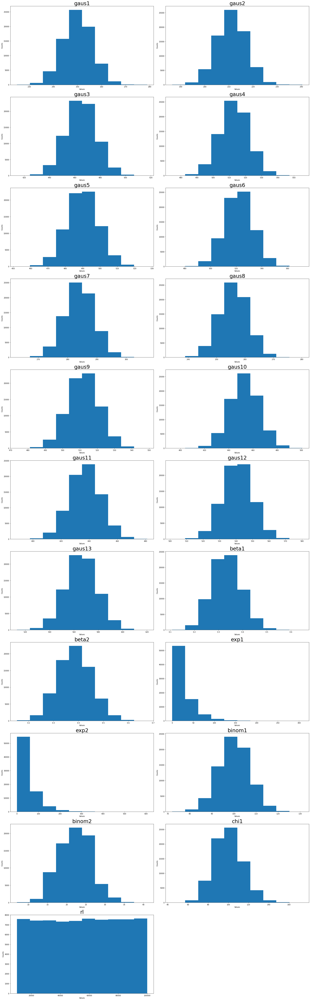

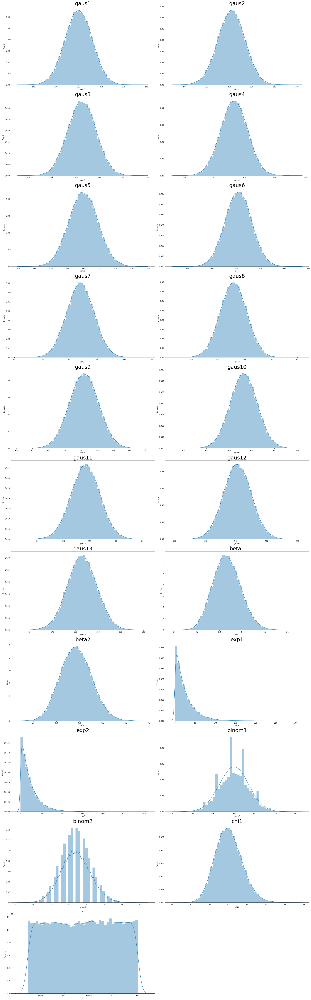

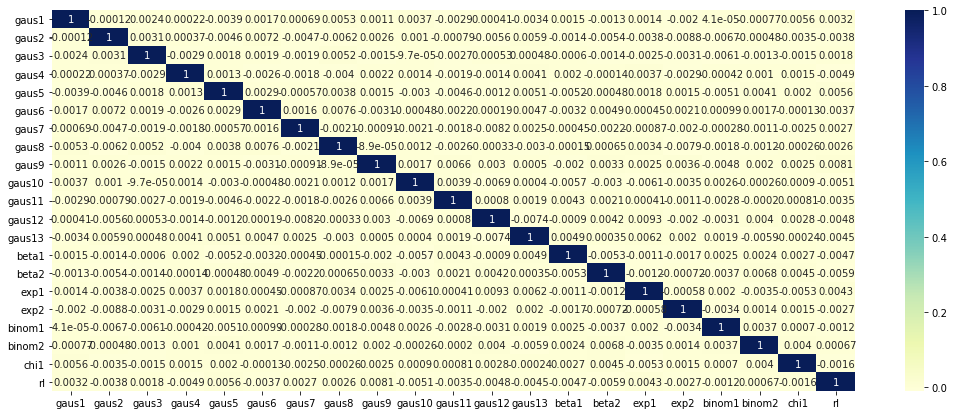

(75000, 21)
(75000, 20)
(75000,)


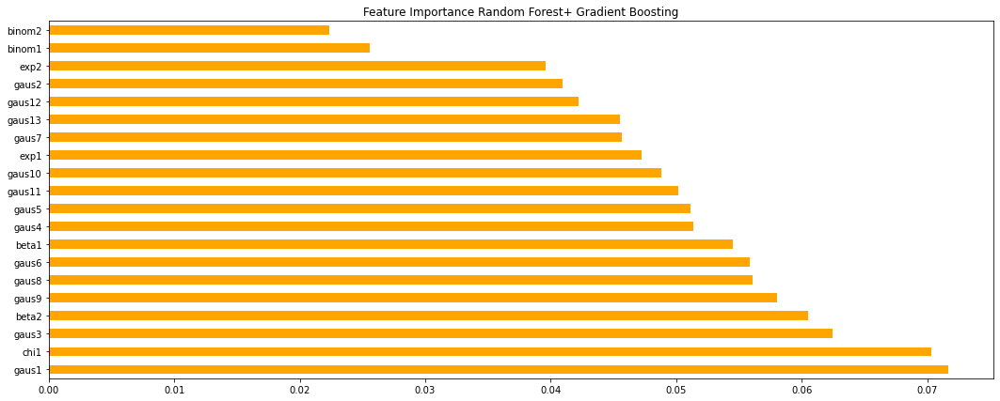

Index(['gaus1', 'chi1', 'gaus3', 'beta2', 'gaus9', 'gaus8', 'gaus6', 'beta1',
       'gaus4', 'gaus5', 'rl'],
      dtype='object')
(75000, 11)
(75000, 10)
(75000,)
Model: Linear Regression   Fitting Time Duration - 0.0110
Model: Linear Regression   predicting-y Time Duration - 0.0029
10
22500
   data_name percent_change      model_details fit_time predict_y_time  \
0     data_1             0%  Linear Regression   0.0105         0.0022   
1     data_1             0%   Lasso Regression   0.0096         0.0019   
2     data_1             0%   Ridge Regression   0.0075         0.0023   
3     data_1             0%      Decision Tree   0.2884         0.0026   
4     data_1             0%      Random Forest   9.0981         0.0325   
..       ...            ...                ...      ...            ...   
84    data_1       45% decr      Random Forest   8.7595         0.0343   
85    data_1       45% decr  Graident Boosting   6.4162         0.0090   
86    data_1       45% decr            

In [19]:
c =range(5,55,5)
c
dfs=[]
for k in c:
    w= data_1.change_dataframe_decr(k)
    dfs.append(w)
    print(k)
    res_decr = data_models(w,'data_1',str(k)+'% decr')

## Result with Incremental change in dataset parameters

In [ ]:
c =range(5,55,5)
c
dfs=[]
for k in c:
    w= data_1.change_dataframe_incr(k)
    dfs.append(w)
    print(k)
    res_incr = data_models(w,'data_1',str(k)+'% incr')

In [21]:
results = res_incr

In [22]:
print(results.shape)

(176, 9)


## Results visualizations

In [23]:
# df_v = results1.copy()

df_v = results.copy()


In [24]:
new = df_v["percent_change"].str.split("%", n = 1, expand = True)

new.columns=['pc','type_change']

df_v['prcnt']=new['pc'].astype('int')

df_v['type_change']=new['type_change']


def sign_change(type):
    if type==' decr':
        return (-1)
    else:
        return (1)
    
df_v['sign_ch'] = df_v['type_change'].apply(sign_change)

df_v['change']=df_v.prcnt * df_v.sign_ch

df_v



,data_name,percent_change,model_details,fit_time,predict_y_time,rmse,mse,R2,Ajusted_R2,prcnt,type_change,sign_ch,change
0,data_1,0%,Linear Regression,0.0105,0.0022,26044.288031,6.783049e+08,0.000244,-0.000201,0,,1,0
1,data_1,0%,Lasso Regression,0.0096,0.0019,26044.302210,6.783057e+08,0.000243,-0.000202,0,,1,0
2,data_1,0%,Ridge Regression,0.0075,0.0023,26044.288031,6.783049e+08,0.000244,-0.000201,0,,1,0
3,data_1,0%,Decision Tree,0.2884,0.0026,26080.368046,6.801856e+08,-0.002528,-0.002974,0,,1,0
4,data_1,0%,Random Forest,9.0981,0.0325,26049.963218,6.786006e+08,-0.000192,-0.000637,0,,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,data_1,50% incr,Decision Tree,0.4033,0.0039,26082.595790,6.803018e+08,-0.002699,-0.003145,50,incr,1,50
172,data_1,50% incr,Random Forest,8.9416,0.0286,26052.039691,6.787088e+08,-0.000351,-0.000796,50,incr,1,50
173,data_1,50% incr,Graident Boosting,6.2067,0.0084,26051.949125,6.787041e+08,-0.000345,-0.000789,50,incr,1,50
174,data_1,50% incr,k-NN,0.1220,4.0388,28460.755168,8.100146e+08,-0.193884,-0.194415,50,incr,1,50


In [25]:
df_v_r=df_v.copy()

In [26]:
df_v_r= df_v_r.drop(columns=['prcnt','sign_ch'])

df_v_r

,data_name,percent_change,model_details,fit_time,predict_y_time,rmse,mse,R2,Ajusted_R2,type_change,change
0,data_1,0%,Linear Regression,0.0105,0.0022,26044.288031,6.783049e+08,0.000244,-0.000201,,0
1,data_1,0%,Lasso Regression,0.0096,0.0019,26044.302210,6.783057e+08,0.000243,-0.000202,,0
2,data_1,0%,Ridge Regression,0.0075,0.0023,26044.288031,6.783049e+08,0.000244,-0.000201,,0
3,data_1,0%,Decision Tree,0.2884,0.0026,26080.368046,6.801856e+08,-0.002528,-0.002974,,0
4,data_1,0%,Random Forest,9.0981,0.0325,26049.963218,6.786006e+08,-0.000192,-0.000637,,0
...,...,...,...,...,...,...,...,...,...,...,...
171,data_1,50% incr,Decision Tree,0.4033,0.0039,26082.595790,6.803018e+08,-0.002699,-0.003145,incr,50
172,data_1,50% incr,Random Forest,8.9416,0.0286,26052.039691,6.787088e+08,-0.000351,-0.000796,incr,50
173,data_1,50% incr,Graident Boosting,6.2067,0.0084,26051.949125,6.787041e+08,-0.000345,-0.000789,incr,50
174,data_1,50% incr,k-NN,0.1220,4.0388,28460.755168,8.100146e+08,-0.193884,-0.194415,incr,50


In [27]:

df_v_r_sorted = df_v_r.sort_values("mse", ascending=True)

df_v_r_sorted

,data_name,percent_change,model_details,fit_time,predict_y_time,rmse,mse,R2,Ajusted_R2,type_change,change
0,data_1,0%,Linear Regression,0.0105,0.0022,26044.288031,6.783049e+08,0.000244,-0.000201,,0
2,data_1,0%,Ridge Regression,0.0075,0.0023,26044.288031,6.783049e+08,0.000244,-0.000201,,0
1,data_1,0%,Lasso Regression,0.0096,0.0019,26044.302210,6.783057e+08,0.000243,-0.000202,,0
73,data_1,40% decr,Lasso Regression,0.0063,0.0015,26044.690719,6.783259e+08,0.000213,-0.000232,decr,-40
74,data_1,40% decr,Ridge Regression,0.0056,0.0018,26044.744767,6.783287e+08,0.000209,-0.000236,decr,-40
...,...,...,...,...,...,...,...,...,...,...,...
39,data_1,15% decr,Scaled k-NN,0.1266,6.5781,28644.038714,8.204810e+08,-0.209310,-0.209848,decr,-15
15,data_1,5% incr,Scaled k-NN,0.1439,10.0090,28650.045883,8.208251e+08,-0.209817,-0.210355,incr,5
55,data_1,25% decr,Scaled k-NN,0.1653,9.6319,28673.178499,8.221512e+08,-0.211772,-0.212311,decr,-25
158,data_1,40% incr,k-NN,0.1184,4.1436,28678.339357,8.224471e+08,-0.212208,-0.212747,incr,40


In [28]:
fig = px.bar(df_v_r_sorted, x="change", y="mse",color='model_details', barmode='group', title='MSE vs %change') 
fig.show()

In [29]:

grouped_df_v_r_sorted = df_v_r_sorted.loc[df_v_r_sorted.groupby('change').mse.idxmin()].reset_index(drop=True)
grouped_df_v_r_sorted

,data_name,percent_change,model_details,fit_time,predict_y_time,rmse,mse,R2,Ajusted_R2,type_change,change
0,data_1,50% decr,Linear Regression,0.0110,0.0029,26045.897328,6.783888e+08,0.000120,-0.000324,decr,-50
1,data_1,45% decr,Linear Regression,0.0082,0.0027,26046.396373,6.784148e+08,0.000082,-0.000363,decr,-45
2,data_1,40% decr,Lasso Regression,0.0063,0.0015,26044.690719,6.783259e+08,0.000213,-0.000232,decr,-40
3,data_1,35% decr,Linear Regression,0.0085,0.0021,26044.769821,6.783300e+08,0.000207,-0.000238,decr,-35
4,data_1,30% decr,Linear Regression,0.0095,0.0021,26046.068015,6.783977e+08,0.000107,-0.000338,decr,-30
...,...,...,...,...,...,...,...,...,...,...,...
16,data_1,30% incr,Linear Regression,0.0109,0.0019,26046.145634,6.784017e+08,0.000101,-0.000344,incr,30
17,data_1,35% incr,Linear Regression,0.0095,0.0034,26048.728523,6.785363e+08,-0.000097,-0.000542,incr,35
18,data_1,40% incr,Random Forest,8.9786,0.0291,26048.265111,6.785121e+08,-0.000062,-0.000506,incr,40
19,data_1,45% incr,Linear Regression,0.0141,0.0018,26045.083956,6.783464e+08,0.000183,-0.000262,incr,45


In [30]:
fig = go.Figure(data=go.Scatter(x=grouped_df_v_r_sorted['change'], y=grouped_df_v_r_sorted['mse'], mode='lines', marker=dict(color='green')))
fig.update_layout(title='MSE vs Percent incremental change of Distribution Parameter', xaxis_title='% Change', yaxis_title='MSE')
fig.show()

In [31]:
fig = px.bar(grouped_df_v_r_sorted, x="change", y="mse",color='model_details', barmode='group', title='MSE vs %change') 
fig.show()

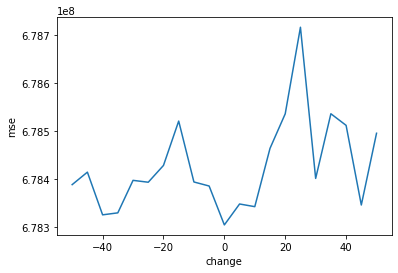

In [32]:
sns.lineplot(x="change", y="mse", data=grouped_df_v_r_sorted)
plt.show()

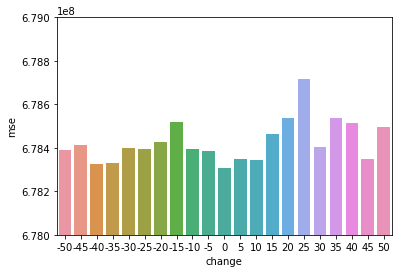

In [35]:
q=sns.barplot(x = 'change',
            y = 'mse',
            data = grouped_df_v_r_sorted)
 
q.set_ylim(6.78e8, 6.79e8)
# Show the plot
plt.show()


In [ ]:
results_sorted_row = grouped_df_v_r_sorted.sort_values("mse", ascending=True)

results_sorted_row

# Conclusion by changing pd parameter from -50% to 50%


#### 1. From all figures no significant trend can be detected regarding the effect of change in pd parameters, the MSE results are fluctuating as pd percentage change varies 

#### 2. There is a one time certain peak in MSE as the % change of pd increases followed by a drop this shows that there might be increment in MSE as %change of pd increases. 

## Hence no change or decreasing change of %pd might give slightly better results 

### Observing all the plots and charts we can see that MSE is minimum at 0% chnage hence we will use the original dataset 0% pd change for further analysis

# Effect of row numbers on results

# Adding rows

# Data_2 (500000 rows)

The data frame should have columns : 20
The data frame will have rows : 500000
the  65 % of gaussian distrubution  in our dataset will have gausian distributed columns : 13
the  10 % of beta_dist distrubution  in our dataset will have beta_dist distributed columns : 2
the  10 % of exponential distrubution  in our dataset will have exponential distributed columns : 2
the  10 % of binomial distrubution  in our dataset will have binomial distributed columns : 2
the  5 % of chisquare distrubution  in our dataset will have chisquare distributed columns : 1
The data frame will have total columns : 20
(500000, 21)
Distribution parameters

For Gausian Distribution:
mu : [500, 427, 532, 445, 441, 411, 452, 500, 547, 407, 486, 431, 410] 
sigma : [12, 9, 12, 9, 12, 12, 12, 10, 11, 11, 11, 10, 13]

For Exponential Distribution:
beat : [50, 58]

For Beta Distribution:
alpha : [20, 19] 
bet : [40, 41]

For Binomial Distribution:
number_of_trials : [200, 176] 
prob_of_success_of_trial : [0.5, 0.55]



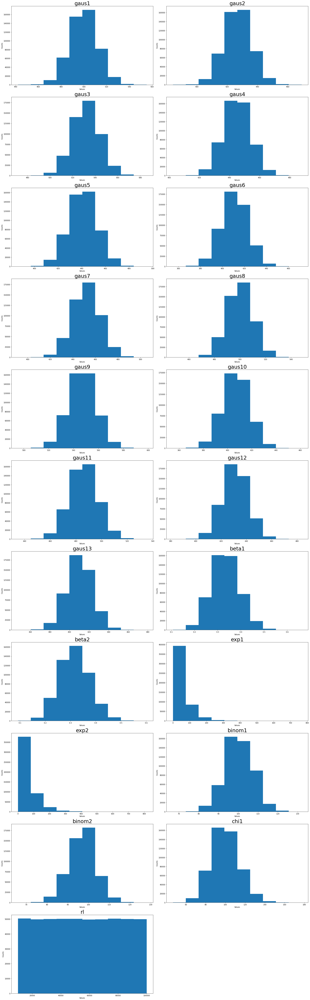

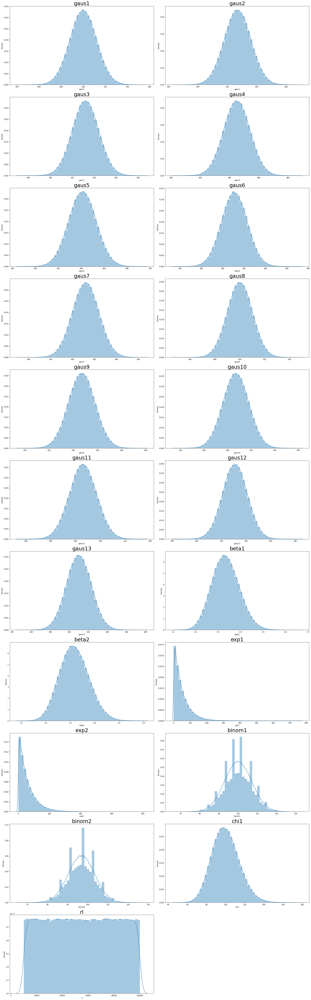

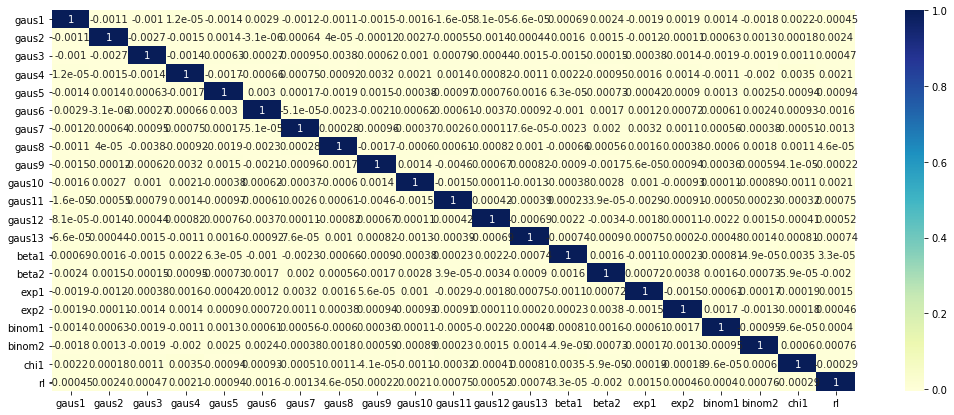

(500000, 21)
(500000, 20)
(500000,)


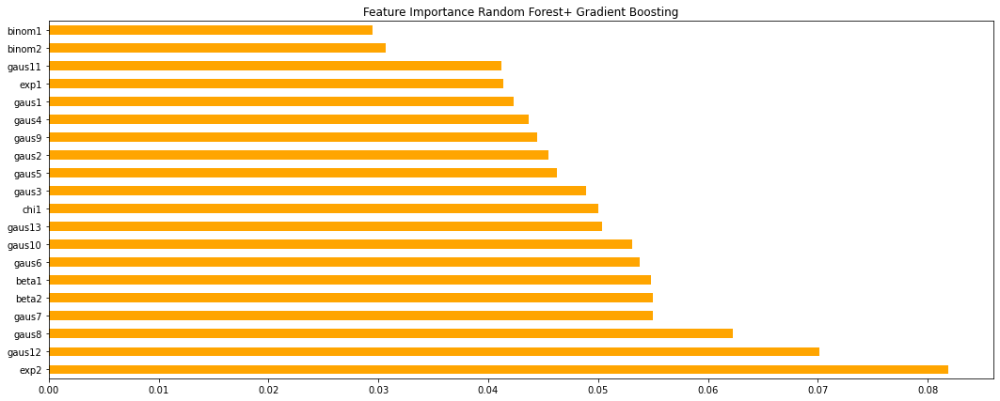

Index(['exp2', 'gaus12', 'gaus8', 'gaus7', 'beta2', 'beta1', 'gaus6', 'gaus10',
       'gaus13', 'chi1', 'rl'],
      dtype='object')
(500000, 11)
(500000, 10)
(500000,)
Model: Linear Regression   Fitting Time Duration - 0.0791
Model: Linear Regression   predicting-y Time Duration - 0.0055
10
150000
    data_name percent_change      model_details fit_time predict_y_time  \
0      data_1             0%  Linear Regression   0.0105         0.0022   
1      data_1             0%   Lasso Regression   0.0096         0.0019   
2      data_1             0%   Ridge Regression   0.0075         0.0023   
3      data_1             0%      Decision Tree   0.2884         0.0026   
4      data_1             0%      Random Forest   9.0981         0.0325   
..        ...            ...                ...      ...            ...   
172    data_1       50% incr      Random Forest   8.9416         0.0286   
173    data_1       50% incr  Graident Boosting   6.2067         0.0084   
174    data_1       50% 

In [36]:

## dataset(column_number,row_number,gausian_percent, exponential_percent, beta_dist_perecnt,binomial_precent,chisquare_perecent)

data_2=dataset(20,500000,65,10,10,10,5)


dataset.count_dataset()
## Dataset Description
data_2.print_desc()
## Creating Dataset
data_2.make_gausian(500,12)

data_2.make_beta_dist(20,40)

data_2.make_exponential(50)

data_2.make_binomial(200,0.5)

data_2.make_chisquare(100)

data_2.make_label_rl()

data_2.make_dataframe()

df_2=data_2.df

print(df_2.shape)

df_2.head()
## Dataset Distribution parameters description
data_2.print_parameters_desc()

results_0 = data_models(df_2,'data_2','0%')



# Data_3 (1000000 rows)

The data frame should have columns : 20
The data frame will have rows : 1000000
the  65 % of gaussian distrubution  in our dataset will have gausian distributed columns : 13
the  10 % of beta_dist distrubution  in our dataset will have beta_dist distributed columns : 2
the  10 % of exponential distrubution  in our dataset will have exponential distributed columns : 2
the  10 % of binomial distrubution  in our dataset will have binomial distributed columns : 2
the  5 % of chisquare distrubution  in our dataset will have chisquare distributed columns : 1
The data frame will have total columns : 20
(1000000, 21)
Distribution parameters

For Gausian Distribution:
mu : [500, 539, 563, 413, 545, 589, 494, 551, 559, 572, 489, 429, 526] 
sigma : [12, 13, 9, 9, 9, 9, 9, 13, 9, 11, 11, 11, 13]

For Exponential Distribution:
beat : [50, 47]

For Beta Distribution:
alpha : [20, 20] 
bet : [40, 47]

For Binomial Distribution:
number_of_trials : [200, 225] 
prob_of_success_of_trial : [0.5, 0.53]

Fo

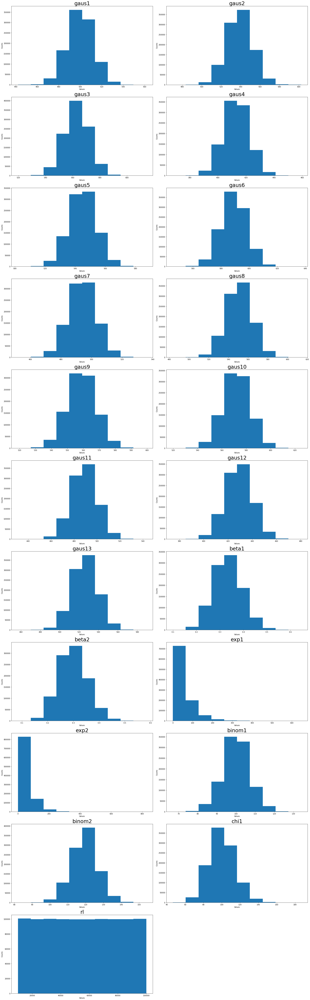

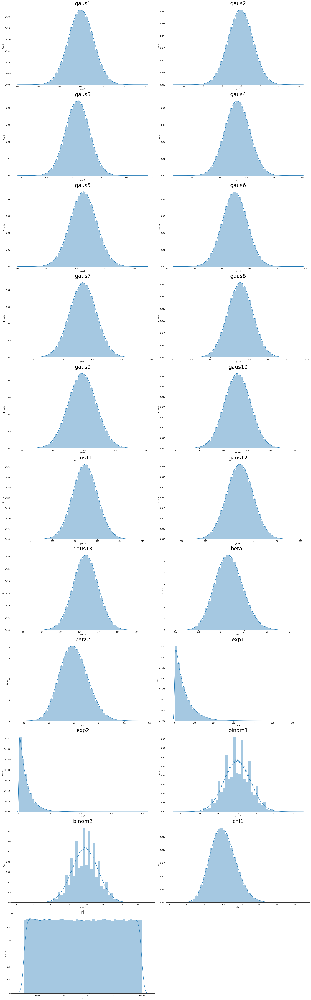

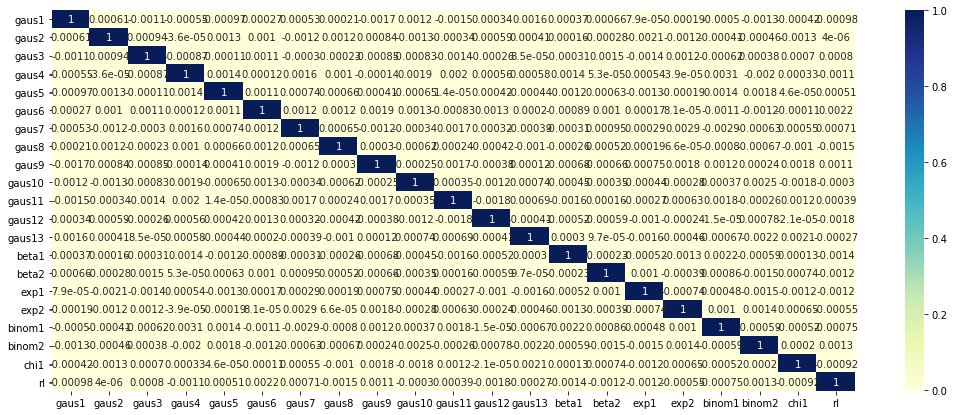

(1000000, 21)
(1000000, 20)
(1000000,)


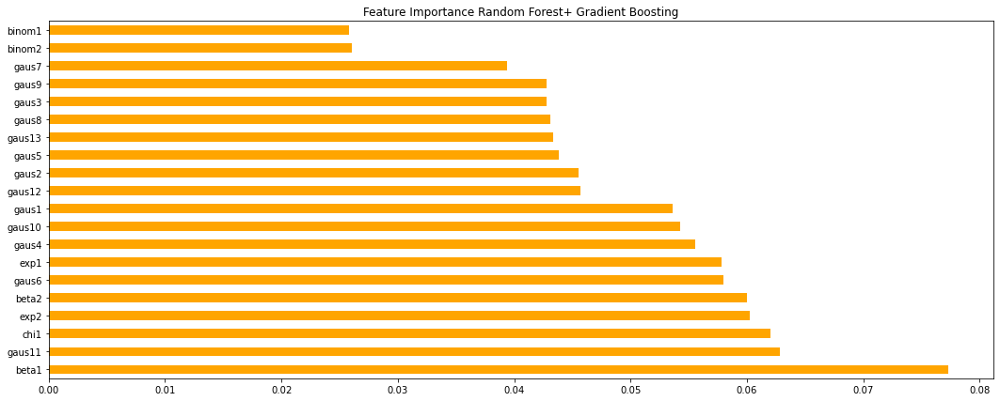

Index(['beta1', 'gaus11', 'chi1', 'exp2', 'beta2', 'gaus6', 'exp1', 'gaus4',
       'gaus10', 'gaus1', 'rl'],
      dtype='object')
(1000000, 11)
(1000000, 10)
(1000000,)
Model: Linear Regression   Fitting Time Duration - 0.1308
Model: Linear Regression   predicting-y Time Duration - 0.0076
10
300000
    data_name percent_change      model_details fit_time predict_y_time  \
0      data_1             0%  Linear Regression   0.0105         0.0022   
1      data_1             0%   Lasso Regression   0.0096         0.0019   
2      data_1             0%   Ridge Regression   0.0075         0.0023   
3      data_1             0%      Decision Tree   0.2884         0.0026   
4      data_1             0%      Random Forest   9.0981         0.0325   
..        ...            ...                ...      ...            ...   
180    data_2             0%      Random Forest  63.6015         0.1480   
181    data_2             0%  Graident Boosting  39.9827         0.0715   
182    data_2          

In [37]:

## dataset(column_number,row_number,gausian_percent, exponential_percent, beta_dist_perecnt,binomial_precent,chisquare_perecent)

data_3=dataset(20,1000000,65,10,10,10,5)


dataset.count_dataset()
## Dataset Description
data_3.print_desc()
## Creating Dataset
data_3.make_gausian(500,12)

data_3.make_beta_dist(20,40)

data_3.make_exponential(50)

data_3.make_binomial(200,0.5)

data_3.make_chisquare(100)

data_3.make_label_rl()

data_3.make_dataframe()

df_3=data_3.df

print(df_3.shape)

df_3.head()
## Dataset Distribution parameters description
data_3.print_parameters_desc()

results_0 = data_models(df_3,'data_3','0%')



# Row effect viualization

In [38]:
results=results_0
print(results.shape)

(192, 9)


## Visualization for effect of row numbers on results

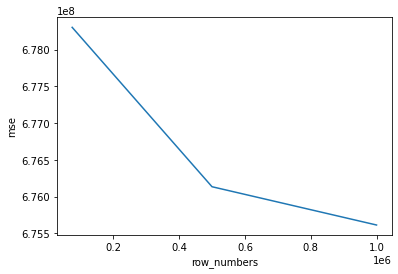

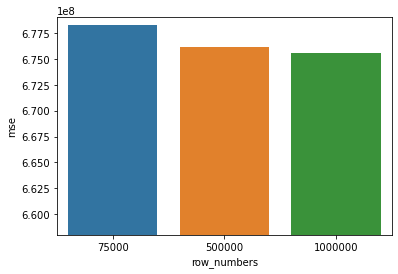

In [56]:


df_v_r = results.copy()

new = df_v_r["percent_change"].str.split("%", n = 1, expand = True)

new.columns=['pc','type_row_numbers']

df_v_r['prcnt']=new['pc'].astype('int')

df_v_r['type_row_numbers']=new['type_row_numbers']


def sign_row_numbers(type):
    if type==' decr':
        return (-1)
    else:
        return (1)
    
df_v_r['sign_ch'] = df_v_r['type_row_numbers'].apply(sign_row_numbers)

df_v_r['row_numbers']=df_v_r.prcnt * df_v_r.sign_ch

df_v_r



def rnum(rn):
    if rn=='data_1':
        return (75000)
    elif rn=='data_2':
        return (500000)
    elif rn=='data_3':
        return (1000000)
    
df_v_r['row_numbers'] = df_v_r['data_name'].apply(rnum)

df_v_r



df_v_r_r=df_v_r.copy()
df_v_r_r= df_v_r_r.drop(columns=['prcnt','sign_ch'])

df_v_r_r

df_v_r_r_sorted = df_v_r_r.sort_values("mse", ascending=True)

df_v_r_r_sorted
# fig = px.bar(df_v_r_r_sorted, x="row_numbers", y="mse",color='model_details', barmode='group', title='MSE vs row_numbers') 
# fig.show()

grouped_df_v_r_r_sorted_row = df_v_r_r_sorted.loc[df_v_r_r_sorted.groupby('row_numbers').mse.idxmin()].reset_index(drop=True)
grouped_df_v_r_r_sorted_row
fig = go.Figure(data=go.Scatter(x=grouped_df_v_r_r_sorted_row['row_numbers'], y=grouped_df_v_r_r_sorted_row['mse'], mode='lines', marker=dict(color='green')))
fig.update_layout(title='MSE vs Percent incremental row_numbers of Distribution Parameter', xaxis_title=' row_numbers', yaxis_title='MSE')
fig.show()
fig = px.bar(grouped_df_v_r_r_sorted_row, x="row_numbers", y="mse",color='model_details', barmode='group', title='MSE vs row_numbers') 
fig.show()
sns.lineplot(x="row_numbers", y="mse", data=grouped_df_v_r_r_sorted_row)
plt.show()
q=sns.barplot(x = 'row_numbers',
            y = 'mse',
            data = grouped_df_v_r_r_sorted_row)
 
q.set_ylim(6.58e8, 6.79e8)
# Show the plot
plt.show()


# Conclusion: (effect of rows):

### It can be seen from graphs that as the number of rows have increased the MSE has decreased and hence results are better

# Final conclusions:


## With this we have come to a the following conslusions:

### 1. Decreasing %pd change may slight decrease MSE and improve results slightly ( weak conlusion )

### 2. Increasing the number of rows decreases the MSE and improves results.